Copyright (c) 2023 Chen Ji Rong Jiang

This code is licensed under the terms of the GNU General Public License v3.0.
You should have received a copy of the GNU General Public License along with this program. If not, see <https://www.gnu.org/licenses/>.

# Preliminary test

# Reference genome testing - Preprocessing

<div class="alert alert-warning">

**What this notebook collection does**
    
This notebook compares the Cell Ranger alignment results from mouse references mm10 (Ensembl 93), using Cell Ranger v3.0 and mm10 (GENCODE vM23/Ensembl 98), using Cell Ranger v6.1 to see if realignment is necessary. The collection of notebooks contains five main sections: 1) Preprocessing, 2) Filtering, 3) Normalization and Clustering, 4) Merging and Clustering
    
<br>   
    
**What the first section (Preprocessing) does**
    
This section takes the aligned h5 files and shapes the data with annotations and quality control metrics. This additional information will be used to filter the data and prepare it for subsequent processing. For each h5 file a <sample_name>_preprocessed.h5ad file will be made which contain all necessary annotation for subsequent filtering. The section contains the following important subsections:

* Doublet detection <br>
* Adding quality metrics and mitochondrial gene removal<br>
  
    
<br>   
    
**What the second section (Filtering) does**

This section visualizes various quality control metric values and filters the data based on a threshold made on the observations/domain knowledge. The section contains the following subsections:

* Doublet filtering <br>
* UMIs and gene counts filtering <br>
    
<br> 
    
**What the third section (Normalization) does**
    
This section normalizes the data based on sequencing depth and gene length so the cells are comparable. Subsequently dimensional reduction and clustering are performed to visualize samples separately. The section contains the following subsections:

* Normalization <br>
* Dimensional reduction <br>
* Marker genes and property annotation visualizations <br>
    
<br>
    
**What the fourth section (Merging and Clustering) does**
    
This section merges the different datasets and visualizes the merged data. The section contains the following subsections:

* Merging <br>
* Alignment parameter visualization <br>
    
</div>  



### Loading libraries
Using sc2_seurat environment

In [4]:
import sys
print(sys.executable)
print(sys.version)
print(sys.version_info)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/bin/python
3.9.9 | packaged by conda-forge | (main, Dec 20 2021, 02:40:17) 
[GCC 9.4.0]
sys.version_info(major=3, minor=9, micro=9, releaselevel='final', serial=0)


In [5]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))#embed HTML within IPython notebook and make containers 90% of screen
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import os
import matplotlib.pyplot as plt

%matplotlib inline
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white') #figure resolution and background color

# This is used
# os.path.join('data/'+object_names[i][6:10]+'_preprocessed.h5ad')
#sc.logging.print_versions()

### Cell Ranger files

In [239]:
#old (ensemble 93)
old_raw = '/hpc/hers_basak/rnaseq_data/Basaklab/jjiang//outputs/count_files/mus_mus/zhong_2021/old/CNR0176487/outs/filtered_feature_bc_matrix.h5'

#new (ensemble 98)
new_raw = '/hpc/hers_basak/rnaseq_data/Basaklab/jjiang//outputs/count_files/mus_mus/zhong_2021/new/CNR0176487/outs/filtered_feature_bc_matrix.h5'


In [240]:
#set data path
os.chdir('/home/hers_basak/jjiang/jack/outputs/deliverables/0_reference_testing/')

In [241]:
os.getcwd()

'/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_reference_testing'

## Load data
The .h5 files from 10x that we are using contains feature and barcode information. Empty barcodes are already filtered out from these files.

In [242]:
files = [old_raw, new_raw]
names = ['CNR0176487_old', 'CNR0176487_new'] #the number is the run ID on cngb
numberobj = len(names)

object_names = list()

#locals() returns dictionary with all local variables and symbols
for i in range(numberobj):
    locals()["adata"+"_"+names[i]] = sc.read_10x_h5(files[i])
    locals()["adata"+"_"+names[i]].var_names_make_unique()
    print("adata"+"_"+names[i],"is loaded")
    
    object_names.append("adata"+"_"+names[i]) # make list of objects for later

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


adata_CNR0176487_old is loaded


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


adata_CNR0176487_new is loaded


In [243]:
adata_CNR0176487_old #gene annotation

AnnData object with n_obs × n_vars = 5668 × 31053
    var: 'gene_ids', 'feature_types', 'genome'

## Basic Preprocessing
### Doublet detection using scrublet
Doublets are droplets that captures two cells, which will lead to inconsistencies. So we need to detect and remove them. First we will annotate the objects with metadata.

https://github.com/swolock/scrublet
https://www.sciencedirect.com/science/article/pii/S2405471218304745

Following the advice of Chromium (below), for 5000 cells recovered, ~4% doublets are to be expected
> https://uofuhealth.utah.edu/huntsman/shared-resources/gba/htg/single-cell/genomics-10x.php


In [244]:
names

['CNR0176487_old', 'CNR0176487_new']

In [245]:
object_names

['adata_CNR0176487_old', 'adata_CNR0176487_new']

(5668, 31053)
(5678, 32285)


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


Detected doublet rate = 2.4%
Estimated detectable doublet fraction = 40.2%
Overall doublet rate:
	Expected   = 4.3%
	Estimated  = 5.9%


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


Detected doublet rate = 2.7%
Estimated detectable doublet fraction = 41.5%
Overall doublet rate:
	Expected   = 4.3%
	Estimated  = 6.6%


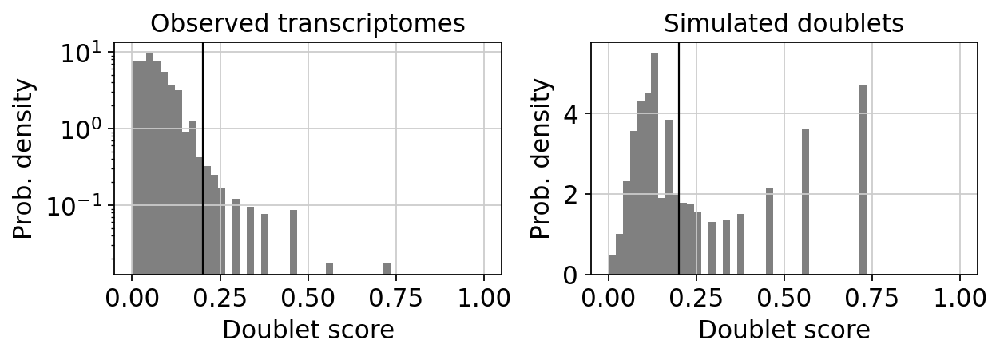

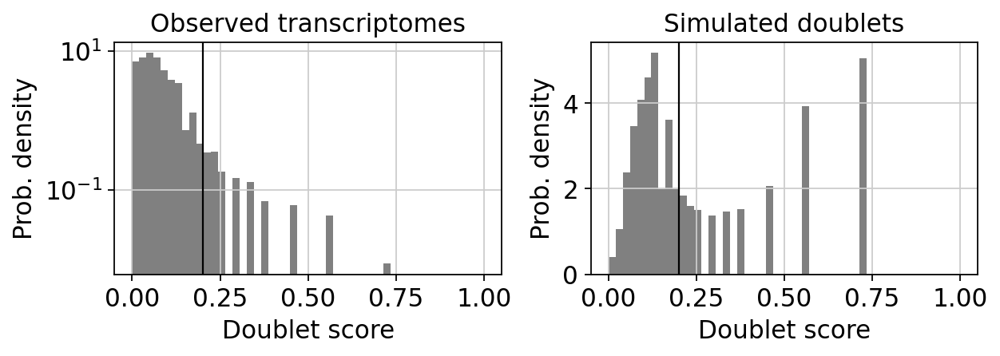

In [246]:
#manually adding metadata due to lack of metadata file
for i in range(numberobj):
    locals()[object_names[i]].obs['species'] = ['Mus musculus','Mus musculus'][i]
    locals()[object_names[i]].obs['gender'] = ['male','male'][i]
    locals()[object_names[i]].obs['age'] = ['6 months','6 months'][i]
    locals()[object_names[i]].obs['cngb_sample_id'] = ['CNS0195744','CNS0195744'][i]
    locals()[object_names[i]].obs['sample_name'] = names[i]
    
#viewing object annotations
for i in range(numberobj):
    print(locals()[object_names[i]].shape)
    
#determine expected doublet rate with 10X Genomics User Guide (5668 objects,recovered -> ~4.32%)
thr = 0.20
for i in range(numberobj):
    #predicts doublets and adds a score to objects
    sc.external.pp.scrublet(locals()[object_names[i]], expected_doublet_rate=0.0432, stdev_doublet_rate=0.02, 
                            synthetic_doublet_umi_subsampling=1.0, knn_dist_metric='euclidean', normalize_variance=True, 
                            log_transform=False, mean_center=True, n_prin_comps=30, use_approx_neighbors=True, 
                            get_doublet_neighbor_parents=False, n_neighbors=None, threshold=thr, verbose=True, copy=False, random_state=0)
    #plot histogram of doublet scores(doesnt work in loop)
    sc.external.pl.scrublet_score_distribution(locals()[object_names[i]], scale_hist_obs='log', scale_hist_sim='linear', figsize=(8, 3),
                                               show=True,return_fig=True)


Check how many cells are higher than the threshold

In [247]:
for i in range(numberobj):
    print(locals()[object_names[i]].obs['predicted_doublet'].value_counts())

False    5534
True      134
Name: predicted_doublet, dtype: int64
False    5523
True      155
Name: predicted_doublet, dtype: int64


### Add QC and get rid of mitochondrial genes

In [248]:
adata_CNR0176487_new


AnnData object with n_obs × n_vars = 5678 × 32285
    obs: 'species', 'gender', 'age', 'cngb_sample_id', 'sample_name', 'doublet_score', 'predicted_doublet'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'scrublet'

<b> check this: sc.pp.calculate_qc_metrics() </b> <br>
expr_type: kind of values in X (str)<br>
var_type: kind of variables (str)<br>
qc_vars: keys for variables you want to control (collection of str)<br>
percent_top: proportions of top genes to cover, for cummulative proportion of counts (collection of int)<br>
layer: alternative layers for expression data (str)<br>
use_raw: use adata.raw.X for expression values (bool)<br>
inplace: place metrics in adata (bool)<br>
log1p: compute log1p transformed annotations, for very small values (bool)<br>
<br>
<b> return features obs </b> <br>
n_genes_by_counts: The number of genes with at least 1 count in a cell. <br>
total_counts: Total number of counts for a cell. <br>
total_counts_mt:Total number of mt gene counts for a cell. <br>
pct_counts_mt: Proportion (%) of total counts for a cell which are mitochondrial. <br> 
n_genes: Number of genes with a positive count. <br>
total_counts_ribo: Total number of ribosomal counts for a cell. <br>
pct_counts_ribo: Proportion of total counts for a cell which are ribosomal.

In [249]:
import numpy as np

for i in range(numberobj):
    #add mt variable annotation indicating if a gene is ribosomal or not (bool)
    if locals()[object_names[i]].obs['species'][0] == 'Homo sapiens':
        locals()[object_names[i]].var['mt'] = locals()[object_names[i]].var_names.str.startswith('MT-')
    elif locals()[object_names[i]].obs['species'][0] == 'Mus musculus':
        locals()[object_names[i]].var['mt'] = locals()[object_names[i]].var_names.str.startswith('mt-') 
        
    if locals()[object_names[i]].obs['species'][0] == 'Homo sapien':
        locals()[object_names[i]].var['ribo'] = locals()[object_names[i]].var_names.str.startswith('RP')
    elif locals()[object_names[i]].obs['species'][0] == 'Mus musculus':
        locals()[object_names[i]].var['ribo'] = locals()[object_names[i]].var_names.str.startswith('Rp')
    
    sc.pp.calculate_qc_metrics(locals()[object_names[i]], expr_type='counts', var_type='genes', qc_vars=('mt','ribo'), percent_top= (), layer= None, use_raw= False, inplace=True, log1p=True)
     
    locals()[object_names[i]].var_names_make_unique()
    sc.pp.filter_cells(locals()[object_names[i]], min_genes=1) #remove all cells with 0 genes
    
    #sum all mt gene counts per cell and divide by total gene count (done by metrics function)
    #locals()[object_names[i]].obs['percent_mito'] = np.sum(
    #   locals()[object_names[i]][:, mito_genes].X, axis=1) / np.sum(locals()[object_names[i]].X, axis=1)
    
    #total gene count per cell (done by metrics function)
    #ocals()[object_names[i]].obs['n_counts'] =  np.sum(locals()[object_names[i]].X, axis=1)
    
    #add ribo variable annotation indicating if a gene is ribosomal or not (bool)
    
    
    #proportion of ribosomal counts (done by metric)
    #locals()[object_names[i]].obs['percent_ribo'] = np.sum(
    #    locals()[object_names[i]][:, percent_ribo].X, axis=1) / np.sum(locals()[object_names[i]].X, axis=1) #.A1
                 
    # The following is to solve a save issue. Probably because of the NA valies in ther 'predicted_doublet' slot
    locals()[object_names[i]].obs['predicted_doublet'] =  locals()[object_names[i]].obs['predicted_doublet'].astype('str')

    

Checking median number of mitochondrial genes, genes and UMIs per cell to have an idea of the quality of each run:

In [250]:
print("Median numbers before filtering mt genes")
for i in range(numberobj):
    print(
         object_names[i],"\tmito%:",np.median(locals()[object_names[i]].obs['pct_counts_mt']),"\tmedian genes/nuclei:",np.median(locals()[object_names[i]].obs['n_genes']), 
            "\tmedian reads/nuclei:",np.median(locals()[object_names[i]].obs['total_counts']),
           "\tmean genes/nuclei:",int(np.mean(locals()[object_names[i]].obs['n_genes'])),
         "\tmean reads/nuclei:",  int(np.mean(locals()[object_names[i]].obs['total_counts'])))
    

Median numbers before filtering mt genes
adata_CNR0176487_old 	mito%: 0.2387902 	median genes/nuclei: 1798.0 	median reads/nuclei: 3306.0 	mean genes/nuclei: 1794 	mean reads/nuclei: 3541
adata_CNR0176487_new 	mito%: 0.2345206 	median genes/nuclei: 1827.5 	median reads/nuclei: 3360.5 	mean genes/nuclei: 1825 	mean reads/nuclei: 3598


In [251]:
print(adata_CNR0176487_new)
print(adata_CNR0176487_new.obs['total_counts'])
print(adata_CNR0176487_new.obs['pct_counts_mt'])

AnnData object with n_obs × n_vars = 5678 × 32285
    obs: 'species', 'gender', 'age', 'cngb_sample_id', 'sample_name', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'scrublet'
AAACCTGAGATCTGAA-1    3289.0
AAACCTGAGCAAATCA-1    4063.0
AAACCTGAGCAGGTCA-1    1638.0
AAACCTGAGCGACGTA-1    1051.0
AAACCTGAGGAGCGTT-1    3232.0
                       ...  
TTTGTCAGTAGGCTGA-1    2798.0
TTTGTCAGTCATACTG-1     820.0
TTTGTCAGTTTGTGTG-1    4654.0
TTTGTCATCACGGTTA-1    3431.0
TTTGTCATCTCTGCTG-1    2776.0
Name: total_counts, Length: 5678, dtype: float32
AAACCTGAGATCTGAA-1    0.425661
AAACCTGAGCAAATCA-1

Filtering out mito genes to determine number of non mitochondrial genes:

In [252]:
for i in range(numberobj):
    #list all non mitochondrial genes for subsetting the columns
    if locals()[object_names[i]].obs['species'][0] == 'Homo sapien':
         non_mito_genes_list = [name for name in locals()[object_names[i]].var_names if not name.startswith('MT-')]
    elif locals()[object_names[i]].obs['species'][0] == 'Mus musculus':
        non_mito_genes_list = [name for name in locals()[object_names[i]].var_names if not name.startswith('mt-')]
    
    
    locals()[object_names[i]] = locals()[object_names[i]][:, non_mito_genes_list].copy()
    
    locals()[object_names[i]].obs['n_counts_no_mito'] =  np.sum(locals()[object_names[i]].X, axis=1)
    
    
    #recalculate the number of genes, because some cells only had mt gene counts
    sc.pp.filter_cells(locals()[object_names[i]], min_genes=1)

### Recalculate metrics
Note that the qc_vars=None because we want to keep the mt%.

In [253]:
for i in range(numberobj):
    sc.pp.calculate_qc_metrics(locals()[object_names[i]], expr_type='counts', var_type='genes', qc_vars=(), percent_top= (), layer= None, use_raw= False, inplace=True, log1p=True)
adata_CNR0176487_new
print(adata_CNR0176487_new.obs['total_counts'])
print(adata_CNR0176487_new.obs['pct_counts_mt'])

AAACCTGAGATCTGAA-1    3275.0
AAACCTGAGCAAATCA-1    4056.0
AAACCTGAGCAGGTCA-1    1628.0
AAACCTGAGCGACGTA-1    1049.0
AAACCTGAGGAGCGTT-1    3225.0
                       ...  
TTTGTCAGTAGGCTGA-1    2787.0
TTTGTCAGTCATACTG-1     812.0
TTTGTCAGTTTGTGTG-1    4641.0
TTTGTCATCACGGTTA-1    3424.0
TTTGTCATCTCTGCTG-1    2761.0
Name: total_counts, Length: 5678, dtype: float32
AAACCTGAGATCTGAA-1    0.425661
AAACCTGAGCAAATCA-1    0.172286
AAACCTGAGCAGGTCA-1    0.610501
AAACCTGAGCGACGTA-1    0.190295
AAACCTGAGGAGCGTT-1    0.216584
                        ...   
TTTGTCAGTAGGCTGA-1    0.393138
TTTGTCAGTCATACTG-1    0.975610
TTTGTCAGTTTGTGTG-1    0.279330
TTTGTCATCACGGTTA-1    0.204022
TTTGTCATCTCTGCTG-1    0.540346
Name: pct_counts_mt, Length: 5678, dtype: float32


Check for the basic statistics

In [254]:
sc.set_figure_params(figsize=[8,8])

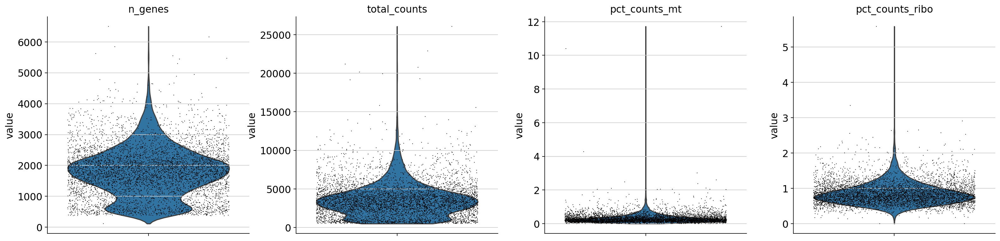

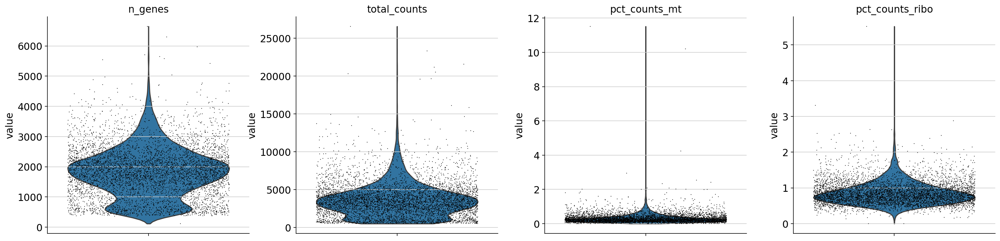

In [263]:
for i in range(numberobj):
    sc.pl.violin(locals()[object_names[i]], ['n_genes', 'total_counts', 'pct_counts_mt','pct_counts_ribo'],
             jitter=0.4, multi_panel=True,size =1)#,save= object_names[i]+"_prefilter_all.pdf")
    plt.show()

In [256]:
print("Median numbers without mitochondrial reads\n")
for i in range(numberobj):
    print(object_names[i],'\t',"\tmedian genes/nuclei:",np.median(locals()[object_names[i]].obs['n_genes']), 
            "\tmedian reads/nuclei:",np.median(locals()[object_names[i]].obs['total_counts']),
           "\tmean genes/nuclei:",int(np.mean(locals()[object_names[i]].obs['n_genes'])),
         "\tmean reads/nuclei:",  int(np.mean(locals()[object_names[i]].obs['total_counts'])))

Median numbers without mitochondrial reads

adata_CNR0176487_old 	 	median genes/nuclei: 1792.5 	median reads/nuclei: 3300.0 	mean genes/nuclei: 1789 	mean reads/nuclei: 3532
adata_CNR0176487_new 	 	median genes/nuclei: 1822.0 	median reads/nuclei: 3353.5 	mean genes/nuclei: 1820 	mean reads/nuclei: 3589


### Save preprocessed files

In [21]:
for i in range(numberobj):
    locals()[object_names[i]].write(os.path.join('data/'+object_names[i][6:]+'_preprocessed.h5ad'))

### Plots

In [22]:
for i in range(numberobj):
    sc.external.pl.scrublet_score_distribution(locals()[object_names[i]], scale_hist_obs='log', scale_hist_sim='linear', figsize=(8, 3),show=True,return_fig=True)

# Reference genome testing - Filtering

<div class="alert alert-warning">
    
**What this section (Merging and Clustering) does**
    
This section merges the filtered data in order to perform dimensional reduction and clustering in order to visualize the data. The output can then be interpreted to determine if the difference in reference genome has a significant effect on the alignment.

</div> 

### Loading libraries
Using sc2_seurat environment

In [23]:
import sys
print(sys.executable)
print(sys.version)
print(sys.version_info)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/bin/python
3.9.9 | packaged by conda-forge | (main, Dec 20 2021, 02:40:17) 
[GCC 9.4.0]
sys.version_info(major=3, minor=9, micro=9, releaselevel='final', serial=0)


In [24]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))#embed HTML within IPython notebook and make containers 90% of screen
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import os
import matplotlib.pyplot as plt

%matplotlib inline
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white') #figure resolution and background color

# This is used
# os.path.join('data/'+object_names[i][6:10]+'_preprocessed.h5ad')
#sc.logging.print_versions()

## Load data
The filtered .h5ad  files from preprocessing section.

In [25]:
#old (ensemble 93)
old_preprocessed = '/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_reference_testing/data/CNR0176487_old_preprocessed.h5ad' 

#new (ensemble 98)
new_preprocessed = '/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_reference_testing/data/CNR0176487_new_preprocessed.h5ad' 


In [26]:
#set data path
os.chdir('/home/hers_basak/jjiang/jack/outputs/deliverables/0_reference_testing/data')

In [27]:
os.getcwd()

'/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_reference_testing/data'

In [28]:
!ls

CNR0176487_new_filtered_1.h5ad	    CNR0176487_old_filtered_1.h5ad
CNR0176487_new_preprocessed_1.h5ad  CNR0176487_old_preprocessed_1.h5ad
CNR0176487_new_preprocessed.h5ad    CNR0176487_old_preprocessed.h5ad


In [29]:
files = [old_preprocessed, new_preprocessed]

In [30]:
names = [name.split('_preprocessed')[0].split('/data/')[1] for name in files ]
print(names)

['CNR0176487_old', 'CNR0176487_new']


In [31]:
object_names_preprocessed =list()
numberobj = len(files)

for i in range(numberobj):
    object_names_preprocessed.append("adata"+"_"+names[i]+"_"+"preprocessed")
    locals()[object_names_preprocessed[i]] = sc.read(files[i]) 
    print(object_names_preprocessed[i],' is loaded')

adata_CNR0176487_old_preprocessed  is loaded
adata_CNR0176487_new_preprocessed  is loaded


## Preprocess - Doublets

<div class="alert alert-warning">

**Important note about doublet filtering**
    
In general the number of doublets looks very low, however, in some runs there seem to be a very close 'bimodal' distribution expression, with the middle point at around 0.2. Following an initial inspection, there doesnt seem to be that many doublets. \
    **TO DO** \
Check if  those with a high score really seem to have high gene counts. Furthermore, mitochondrial and ribosomal genes seem to influence the score for the  'medium' scores (see the plot below). \
I decided to manually set the threshold to 0.20 to filter out some suspicious cells. See if these cluster together  or are dispersed
    

</div>  

### Check gene counts of high doublet scores

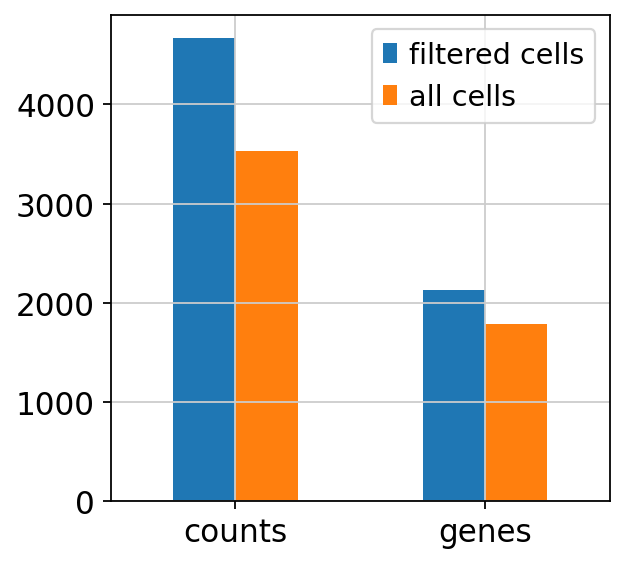

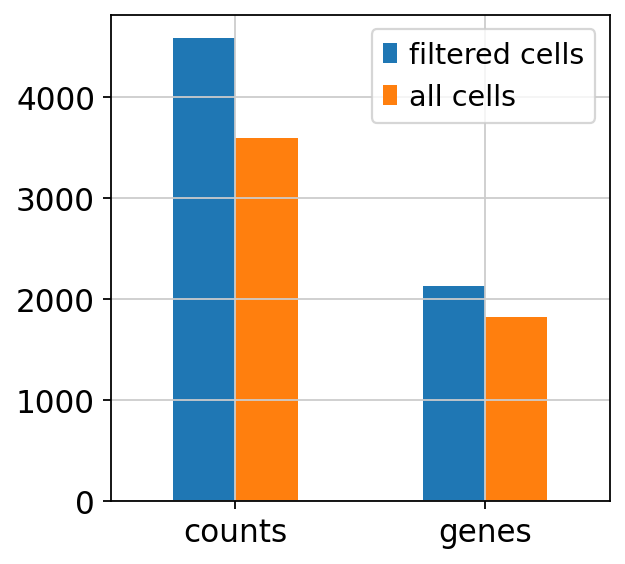

In [32]:
for i in range(numberobj):
    thr = 0.3
    mean_counts_high = int(np.mean(locals()[object_names_preprocessed[i]].obs[locals()[object_names_preprocessed[i]].obs['doublet_score'] > thr]['total_counts']))
    mean_genes_high = int(np.mean(locals()[object_names_preprocessed[i]].obs[locals()[object_names_preprocessed[i]].obs['doublet_score'] >thr]['n_genes']))
    mean_counts = int(np.mean(locals()[object_names_preprocessed[i]].obs['total_counts']))
    mean_genes = int(np.mean(locals()[object_names_preprocessed[i]].obs['n_genes']))
    
    filtered_cells = [mean_counts_high,mean_genes_high]
    all_cells = [mean_counts,mean_genes]
    index = ['counts', 'genes']
    
    df = pd.DataFrame({'filtered cells': filtered_cells, 'all cells': all_cells}, index=index)
    ax = df.plot.bar(rot=0)
    
    #print(locals()[object_names[i]].obs[locals()[object_names[i]].obs['doublet_score'] >0.25][['doublet_score','total_counts']])


### Filtering - Doublets

In [33]:
max_doub_score = 0.2 #scrublet usually does middle of two modes, so this is a bit more lenient

for i in range(numberobj):
    locals()[object_names_preprocessed[i]] = locals()[object_names_preprocessed[i]][locals()[object_names_preprocessed[i]].obs['doublet_score'] < max_doub_score]
    print('filtered!')

filtered!
filtered!


Recalculate values, especially total_counts and without ribo/mito pct change, because there is no mito genes anymore

In [34]:
for i in range(numberobj):
    sc.pp.calculate_qc_metrics(locals()[object_names_preprocessed[i]], expr_type='counts', var_type='genes', qc_vars=(), percent_top= (), layer= None, use_raw= False, inplace=True, log1p=True)
    print('updated!')

Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


updated!
updated!


## Preprocess - Mitochondrial and Ribosomal counts

In [35]:
for i in range(numberobj):
    print(locals()[object_names_preprocessed[i]])

AnnData object with n_obs × n_vars = 5534 × 31040
    obs: 'species', 'gender', 'age', 'cngb_sample_id', 'sample_name', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'n_counts_no_mito'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'scrublet'
AnnData object with n_obs × n_vars = 5523 × 32272
    obs: 'species', 'gender', 'age', 'cngb_sample_id', 'sample_name', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'n_counts_no_m

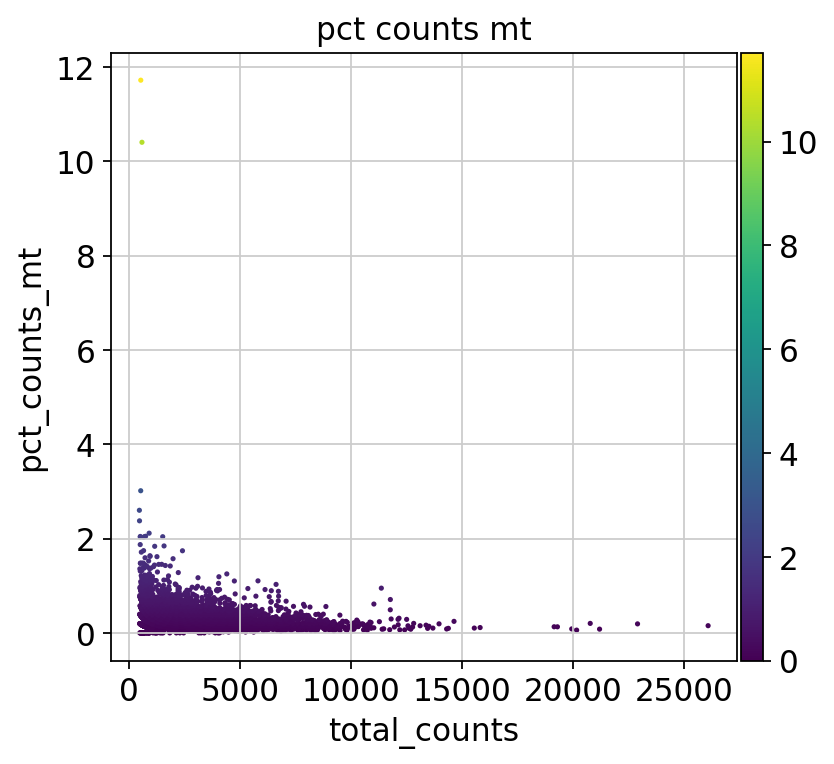

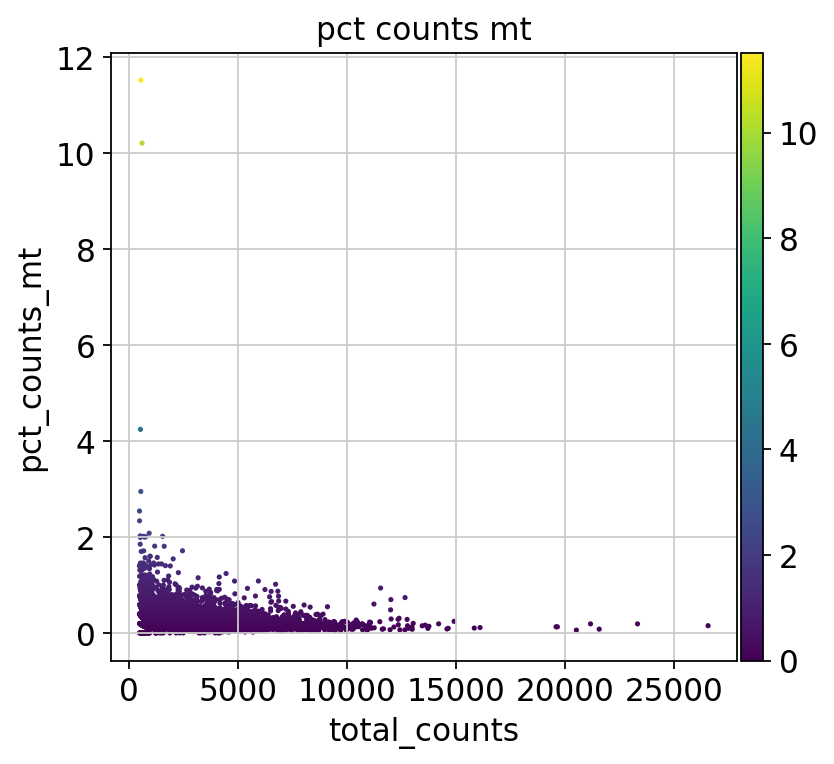

In [36]:
sc.set_figure_params(figsize=[5,5])
for i in range(numberobj):
    sc.pl.scatter(locals()[object_names_preprocessed[i]], x='total_counts', y='pct_counts_mt',color = 'pct_counts_mt',show=False)

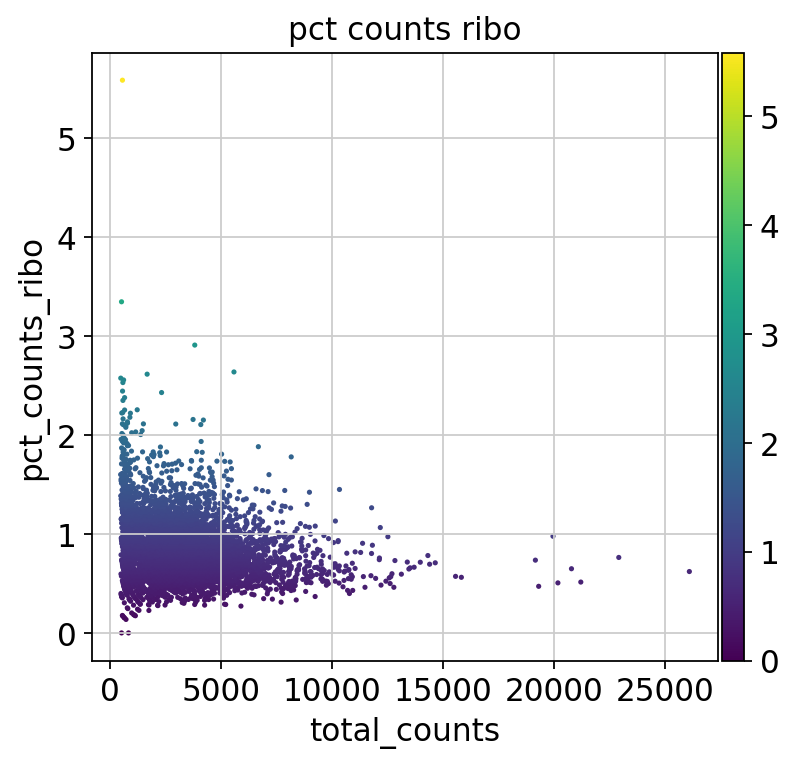

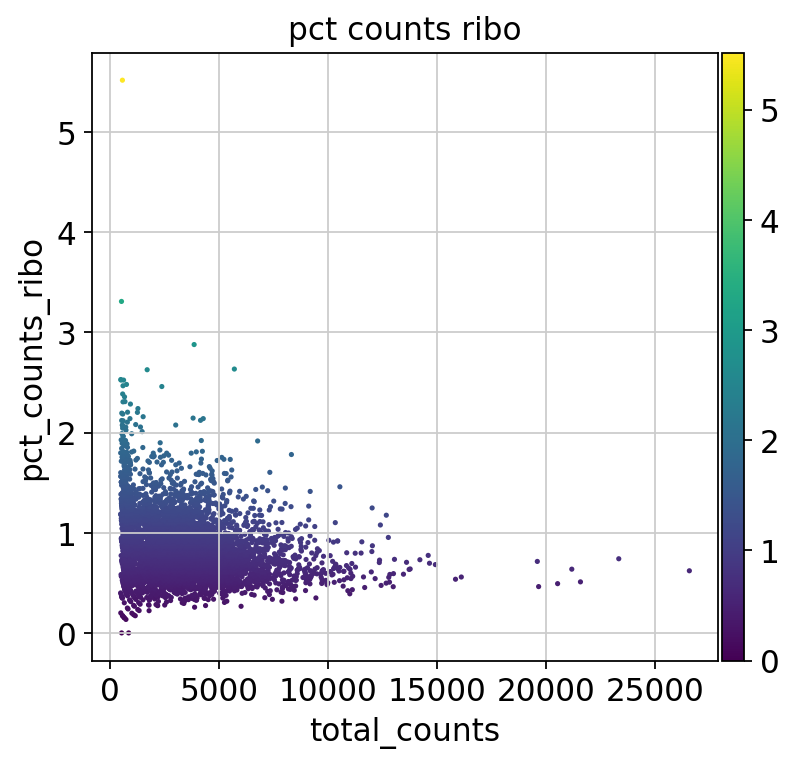

In [37]:
sc.set_figure_params(figsize=[5,5])
for i in range(numberobj):
    sc.pl.scatter(locals()[object_names_preprocessed[i]], x='total_counts', y='pct_counts_ribo',color = 'pct_counts_ribo',show=False)

### Filtering - Mitochondrial% and Ribosomal%

In [38]:
max_pct_mt = 3.0 #%, only filters 3 cell or smth
max_pct_ribo = 3.0 #%
for i in range(numberobj):
    locals()[object_names_preprocessed[i]] = locals()[object_names_preprocessed[i]][locals()[object_names_preprocessed[i]].obs['pct_counts_mt'] < max_pct_mt]
    locals()[object_names_preprocessed[i]] = locals()[object_names_preprocessed[i]][locals()[object_names_preprocessed[i]].obs['pct_counts_ribo'] < max_pct_ribo]

## Preprocess - UMIs and gene counts
Here, I want to use some different techniques to plot the data. This is not always necessary, however, you may want to have a close look at your data when you recieve something new. Seaborn package lets us make publication quality and diver plots, while a custom code from the Theis lab, built on Bokeh library, enables interactive plots 

In [39]:
for i in range(numberobj):
    print(locals()[object_names_preprocessed[i]] )

View of AnnData object with n_obs × n_vars = 5529 × 31040
    obs: 'species', 'gender', 'age', 'cngb_sample_id', 'sample_name', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'n_counts_no_mito'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'scrublet'
View of AnnData object with n_obs × n_vars = 5518 × 32272
    obs: 'species', 'gender', 'age', 'cngb_sample_id', 'sample_name', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes'

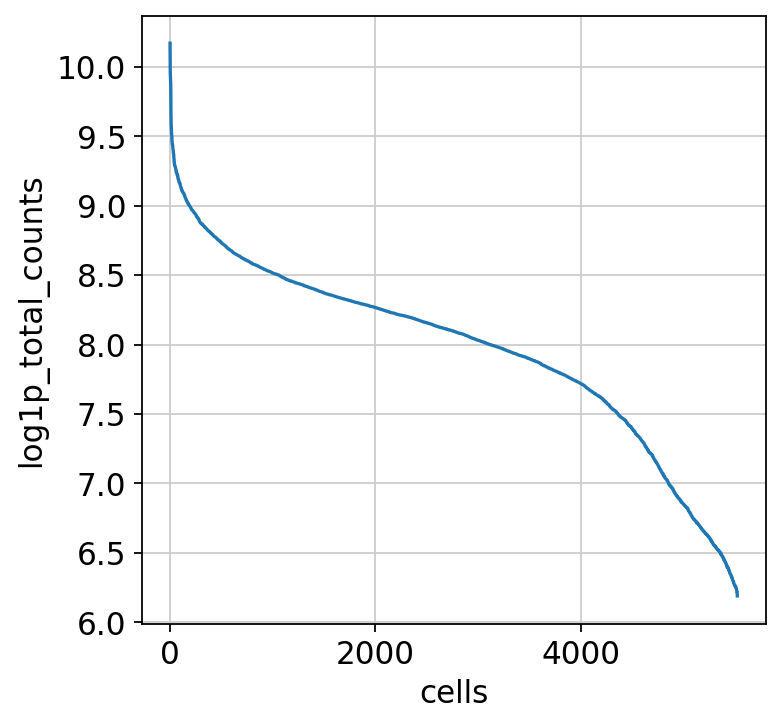

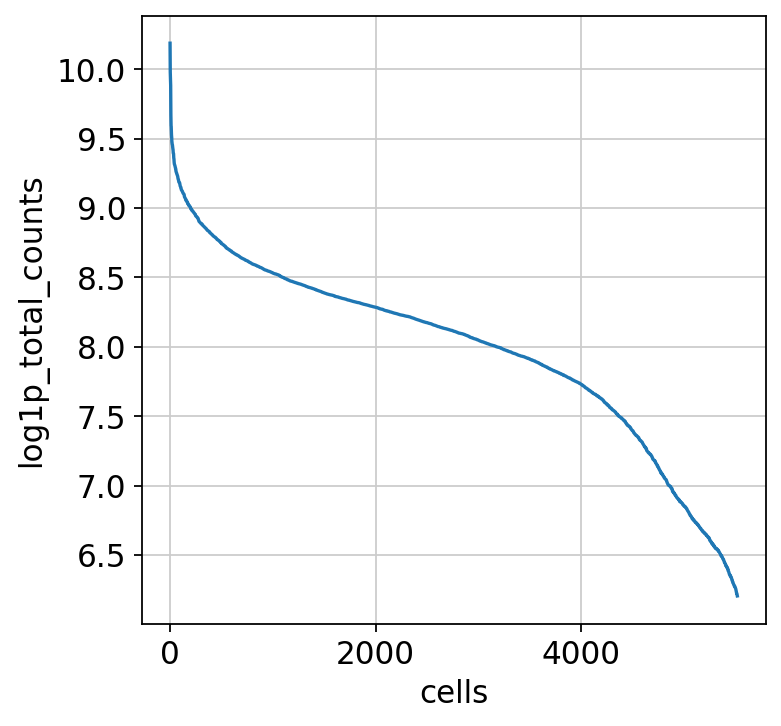

In [40]:
for i in range(numberobj):
    plt.figure()
    total_counts = locals()[object_names_preprocessed[i]].obs['log1p_total_counts'].sort_values(ascending = False)
    index = range(len(total_counts))
    plot = sns.lineplot( x = index, y=total_counts )
    plot.set(xlabel='cells')
    plt.show()

### Seaborn hex plots
These plots allow us to see the distribution of the number of genes and reads, as well as where they are most concentrated (dark colors)

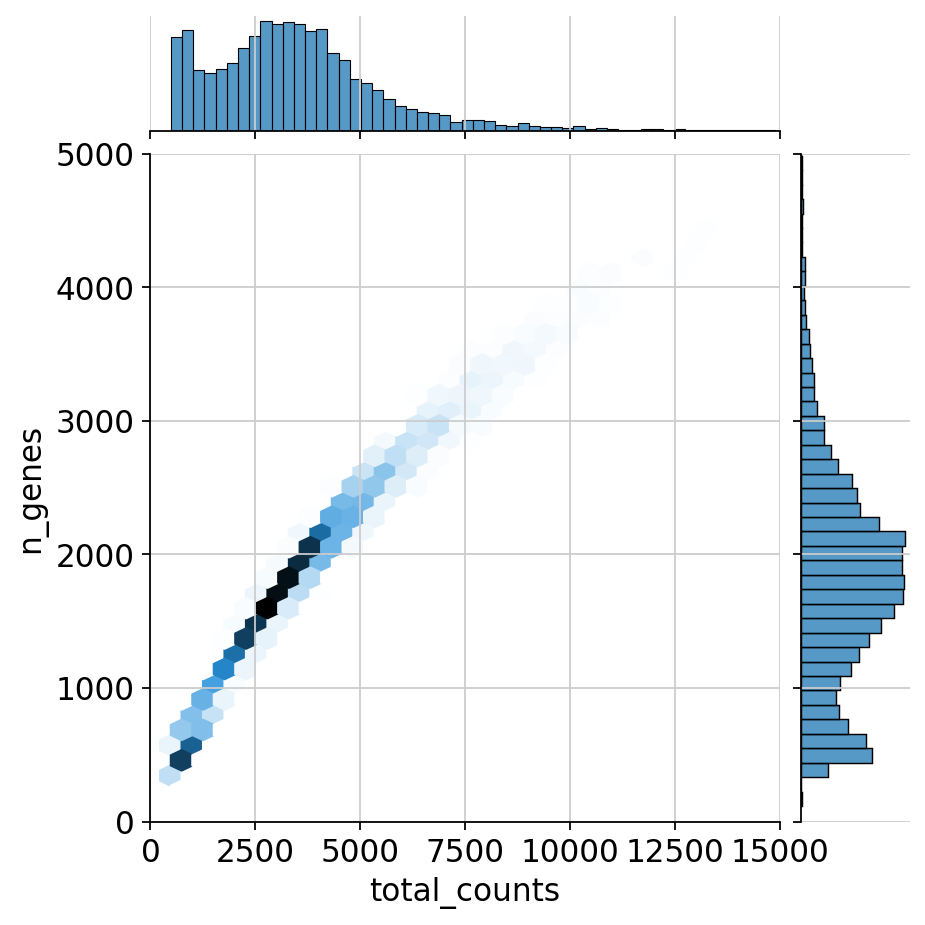

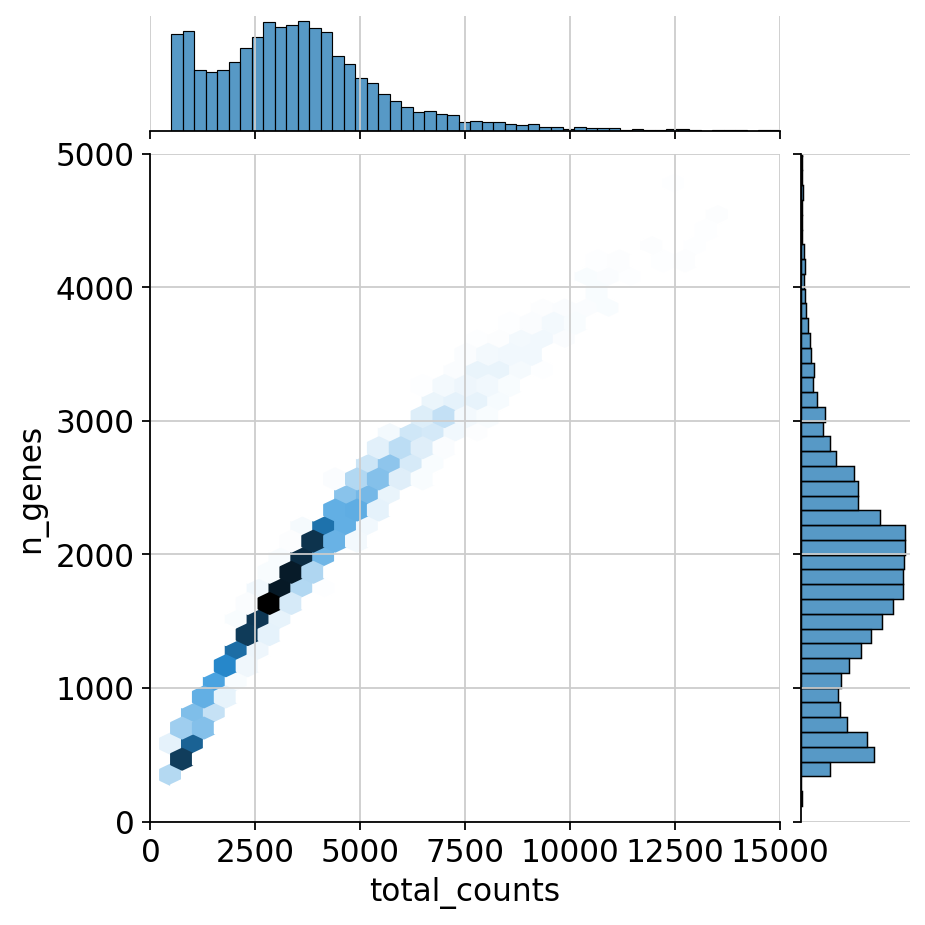

In [41]:
for i in range(numberobj):
    sns.jointplot( x= "total_counts", y= "n_genes", data=locals()[object_names_preprocessed[i]].obs, kind="hex",xlim=[0,15000], ylim=[0,5000])
#kind : { "scatter" | "reg" | "resid" | "kde" | "hex" }

### combined histogram plots
We can compare all libraries to each other using a seaborn histplot

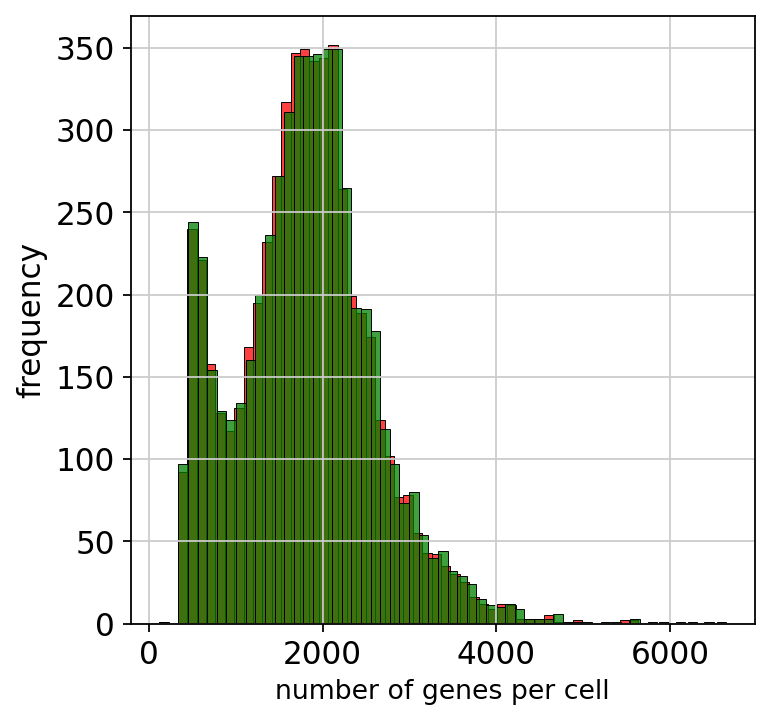

In [42]:
colors_histplot = ['red','green']
for i in range(numberobj):
    plot1 = sns.histplot(data=locals()[object_names_preprocessed[i]].obs,x= 'n_genes',color=colors_histplot[i])
    plot1.set_xlabel("number of genes per cell", fontsize = 12)
    plot1.set_ylabel("frequency", fontsize = 14)

You might want to focus on one area to choose the 'cutoff'

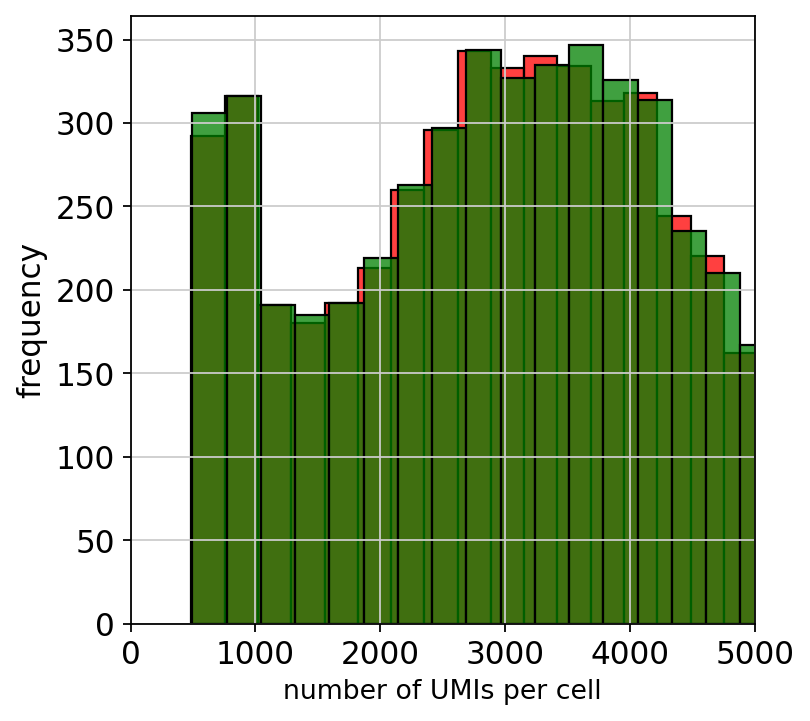

In [43]:
colors_histplot = ['red','green']
plt.xlim(0,5000)
for i in range(numberobj):
    plot2 = sns.histplot(data=locals()[object_names_preprocessed[i]].obs,x= 'total_counts',color=colors_histplot[i])
    plot2.set_xlabel("number of UMIs per cell", fontsize = 12)
    plot2.set_ylabel("frequency", fontsize = 14)

It seems ~? is a good cutoff point

### Filtering - UMI and Gene 
Cells with unusual **low/high UMI** counts should be removed. Low counts could be droplets with only ambient RNA while high counts could be doublets. Here we won't filter out cells with high counts as they might represent a celltype. <br>
Similarly cells with unusual **low/high unique gene** counts should be removed. Low gene counts could be droplets with only ambient RNA while high gene counts could be multiplets. <br>
Nonetheless, these thresholds are sample specific and determining them is an iterative process. <br> 

<br>
NOTE: Cell Ranger Count function autmatically filtered out cells with less than 500 UMI counts (might not be the best for heterogenous data). <br>
For more information see: https://www.10xgenomics.com/resources/analysis-guides/common-considerations-for-quality-control-filters-for-single-cell-rna-seq-data 

In [44]:
min_counts = 500 #default
max_counts = 15000 #filters out none, maybe 15k later
min_genes = 500
max_genes = 5000
min_cells = 3



for i in range(numberobj):
    locals()[object_names_preprocessed[i]] = locals()[object_names_preprocessed[i]][locals()[object_names_preprocessed[i]].obs['total_counts']>=min_counts]
    locals()[object_names_preprocessed[i]] = locals()[object_names_preprocessed[i]][locals()[object_names_preprocessed[i]].obs['total_counts'] < max_counts ]
    locals()[object_names_preprocessed[i]] = locals()[object_names_preprocessed[i]][locals()[object_names_preprocessed[i]].obs['n_genes'] >= min_genes]
    locals()[object_names_preprocessed[i]] = locals()[object_names_preprocessed[i]][locals()[object_names_preprocessed[i]].obs['n_genes'] < max_genes]
    
    sc.pp.filter_genes(locals()[object_names[i]], min_cells=min_cells)

### Recalculate metrics

In [45]:
for i in range(numberobj):
    sc.pp.calculate_qc_metrics(locals()[object_names_preprocessed[i]], expr_type='counts', var_type='genes', qc_vars=(), percent_top= (), layer= None, use_raw= False, inplace=True, log1p=True)
    print(locals()[object_names_preprocessed[i]])
    print(locals()[object_names_preprocessed[i]].obs['total_counts'])

Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


AnnData object with n_obs × n_vars = 5300 × 31040
    obs: 'species', 'gender', 'age', 'cngb_sample_id', 'sample_name', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'n_counts_no_mito'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'scrublet'
AAACCTGAGATCTGAA-1    3216.0
AAACCTGAGCAAATCA-1    3969.0
AAACCTGAGCAGGTCA-1    1608.0
AAACCTGAGCGACGTA-1    1041.0
AAACCTGAGGAGCGTT-1    3170.0
                       ...  
TTTGTCAGTAGGCTGA-1    2727.0
TTTGTCAGTCATACTG-1     796.0
TTTGTCAGTTTGTGTG-1    4559.0
TTTGTCATCACGGTTA-1    3376.0
TTTGTCATCTCTGCTG-1    2701.0
Name: total_counts, Length: 5300, dtype: float32
AnnData object with n_obs × n

In [64]:
object_names_filtered =list()

for i in range(numberobj):
    object_names_filtered.append("adata"+"_"+names[i]+"_"+"filtered")
    locals()[object_names_preprocessed[i]] = locals()[object_names_preprocessed[i]].copy()

In [65]:
for i in range(numberobj):
    locals()[object_names_preprocessed[i]].write(os.path.join(object_names_filtered[i][6:]+'_1.h5ad'))

In [66]:
!ls

CNR0176487_new_filtered_1.h5ad	  CNR0176487_old_filtered_1.h5ad
CNR0176487_new_preprocessed.h5ad  CNR0176487_old_preprocessed.h5ad


# Reference genome testing - Normalization
Data should be normalized in order to compare cells because counts are affected by sequencing depth, gene length and cell cycle phase.
<br>

Standard:
Total-count normalize (library-size correct) the data matrix $\mathbf{X}$ to 10,000 reads per cell, so that counts become comparable among cells.
<br>

Normalise to a fraction:
Use "fraction=0.9" to take only a certain fraction of genes into account for normalisation, not considering the very highly expressed genes (very little information).

### Loading libraries
Using sc2_seurat environment

In [1]:
import sys
print(sys.executable)
print(sys.version)
print(sys.version_info)

/home/hers_basak/jjiang/jack/miniconda/envs/scarches/bin/python
3.9.18 (main, Sep 11 2023, 13:41:44) 
[GCC 11.2.0]
sys.version_info(major=3, minor=9, micro=18, releaselevel='final', serial=0)


In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))#embed HTML within IPython notebook and make containers 90% of screen
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import os
import matplotlib.pyplot as plt

%matplotlib inline
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white') #figure resolution and background color

# This is used
# os.path.join('data/'+object_names[i][6:10]+'_preprocessed.h5ad')
#sc.logging.print_versions()

## Load data
The filtered .h5ad  files from preprocessing section.

In [104]:
#old (ensemble 93)
old_filtered = '/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_reference_testing/data/CNR0176487_old_filtered_1.h5ad' 

#new (ensemble 98)
new_filtered = '/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_reference_testing/data/CNR0176487_new_filtered_1.h5ad' 


In [105]:
#set data path
os.chdir('/home/hers_basak/jjiang/jack/outputs/deliverables/0_testing/0_first_test/')

In [106]:
os.getcwd()

'/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_reference_testing/data'

In [107]:
!ls

CNR0176487_new_filtered_1.h5ad	  CNR0176487_old_preprocessed.h5ad
CNR0176487_new_preprocessed.h5ad  CNR0176487_old_processed.h5ad
CNR0176487_new_processed.h5ad	  CNR01764_reg_processed.h5ad
CNR0176487_old_filtered_1.h5ad	  figures


In [108]:
files = [old_filtered, new_filtered]

In [109]:
names = [name.split('_filtered')[0].split('/data/')[1] for name in files ]
print(names)

['CNR0176487_old', 'CNR0176487_new']


In [110]:
object_names_filtered=list()
numberobj = len(files)

for i in range(numberobj):
    object_names_filtered.append("adata"+"_"+names[i]+"_"+"filtered")
    locals()[object_names_filtered[i]] = sc.read(files[i]) 
    print(object_names_filtered[i],' is loaded')

adata_CNR0176487_old_filtered  is loaded
adata_CNR0176487_new_filtered  is loaded


## Normalization

In [111]:
for i in range(numberobj):
    print(locals()[object_names_filtered[i]].X)

  (0, 0)	5.0
  (0, 15)	1.0
  (0, 22)	3.0
  (0, 29)	2.0
  (0, 38)	2.0
  (0, 40)	1.0
  (0, 41)	1.0
  (0, 57)	1.0
  (0, 61)	1.0
  (0, 64)	1.0
  (0, 71)	2.0
  (0, 106)	2.0
  (0, 108)	4.0
  (0, 120)	1.0
  (0, 123)	10.0
  (0, 136)	2.0
  (0, 144)	2.0
  (0, 145)	1.0
  (0, 212)	2.0
  (0, 214)	2.0
  (0, 225)	1.0
  (0, 229)	1.0
  (0, 288)	2.0
  (0, 297)	6.0
  (0, 307)	1.0
  :	:
  (5299, 30599)	1.0
  (5299, 30612)	1.0
  (5299, 30633)	1.0
  (5299, 30685)	4.0
  (5299, 30701)	1.0
  (5299, 30724)	1.0
  (5299, 30743)	1.0
  (5299, 30756)	1.0
  (5299, 30760)	1.0
  (5299, 30776)	1.0
  (5299, 30781)	1.0
  (5299, 30790)	1.0
  (5299, 30802)	2.0
  (5299, 30806)	1.0
  (5299, 30808)	1.0
  (5299, 30835)	1.0
  (5299, 30845)	1.0
  (5299, 30855)	2.0
  (5299, 30877)	1.0
  (5299, 30895)	1.0
  (5299, 30905)	1.0
  (5299, 30912)	1.0
  (5299, 30955)	2.0
  (5299, 30961)	1.0
  (5299, 31036)	2.0
  (0, 0)	5.0
  (0, 16)	1.0
  (0, 23)	3.0
  (0, 31)	2.0
  (0, 40)	2.0
  (0, 42)	1.0
  (0, 43)	1.0
  (0, 59)	1.0
  (0, 63)	1.0
  (0,

In [112]:
## Normalize and Logarithmize
# Here, only normalise reads in 0.9 fractions of the total
for i in range(numberobj):
    sc.pp.normalize_total(locals()[object_names_filtered[i]], key_added='total_counts_norm')
    locals()[object_names_filtered[i]].raw = locals()[object_names_filtered[i]].copy()
    sc.pp.log1p(locals()[object_names_filtered[i]])
    print(object_names_filtered[i], ' has been normalized and logarithmized')

adata_CNR0176487_old_filtered  has been normalized and logarithmized
adata_CNR0176487_new_filtered  has been normalized and logarithmized


In [113]:
for i in range(numberobj):
    print(locals()[object_names_filtered[i]].X)

  (0, 0)	1.8271438
  (0, 15)	0.71452767
  (0, 22)	1.4181961
  (0, 29)	1.1270192
  (0, 38)	1.1270192
  (0, 40)	0.71452767
  (0, 41)	0.71452767
  (0, 57)	0.71452767
  (0, 61)	0.71452767
  (0, 64)	0.71452767
  (0, 71)	1.1270192
  (0, 106)	1.1270192
  (0, 108)	1.6434307
  (0, 120)	0.71452767
  (0, 123)	2.4364352
  (0, 136)	1.1270192
  (0, 144)	1.1270192
  (0, 145)	0.71452767
  (0, 212)	1.1270192
  (0, 214)	1.1270192
  (0, 225)	0.71452767
  (0, 229)	0.71452767
  (0, 288)	1.1270192
  (0, 297)	1.9822873
  (0, 307)	0.71452767
  :	:
  (5299, 30599)	0.80742747
  (5299, 30612)	0.80742747
  (5299, 30633)	0.80742747
  (5299, 30685)	1.7865007
  (5299, 30701)	0.80742747
  (5299, 30724)	0.80742747
  (5299, 30743)	0.80742747
  (5299, 30756)	0.80742747
  (5299, 30760)	0.80742747
  (5299, 30776)	0.80742747
  (5299, 30781)	0.80742747
  (5299, 30790)	0.80742747
  (5299, 30802)	1.2482572
  (5299, 30806)	0.80742747
  (5299, 30808)	0.80742747
  (5299, 30835)	0.80742747
  (5299, 30845)	0.80742747
  (5299, 3085

### Identify highly-variable genes
This step is important to choose the feature that will be used for dimensionality reduction ()

In [114]:
for i in range(numberobj): 
    sc.pp.highly_variable_genes(locals()[object_names_filtered[i]], min_mean=0.0125, max_mean=3, min_disp=0.5,flavor='seurat') #seurat_v3 is giving an error
    print('worked')

worked
worked


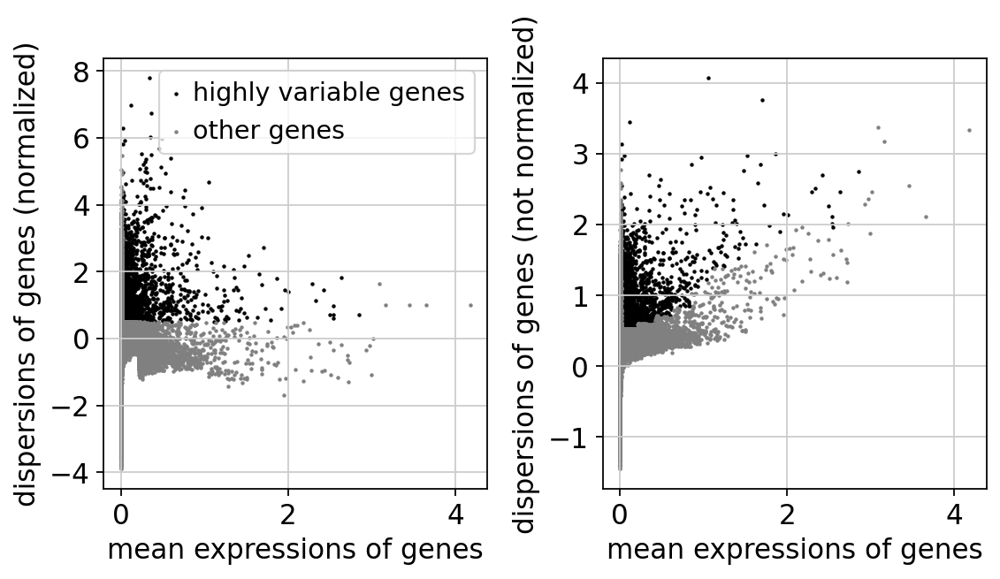

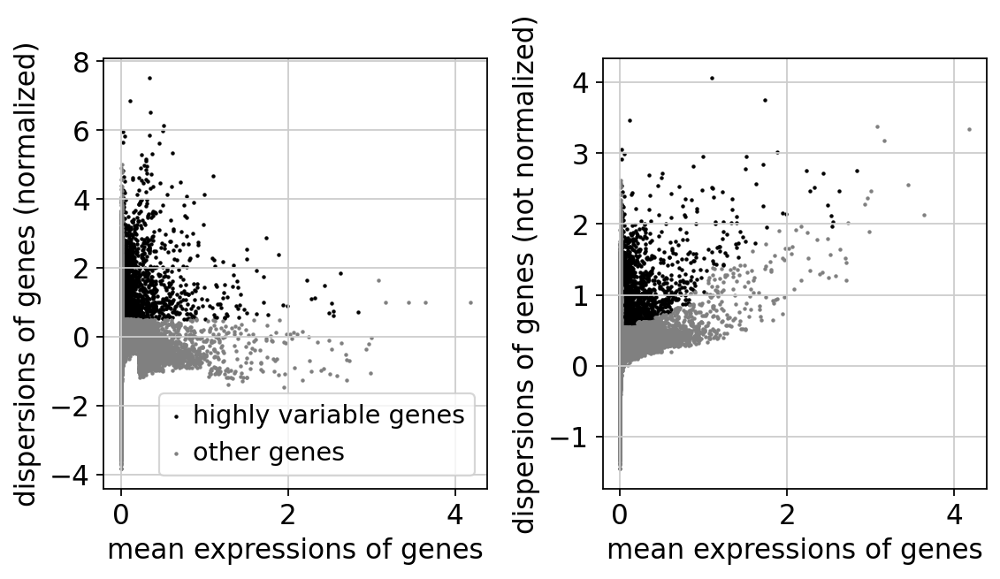

In [115]:
for i in range(numberobj): 
    sc.pl.highly_variable_genes(locals()[object_names_filtered[i]])

### regress and scale
We will compare data regressed for the number of counts and scaled to unprocessed data. It is better to do the least possible. This also saves from memory and disk space. Still, if the number of counts influence the embedding, we need to correct for this \
Note: You could skip filtering for highly variable genes only if you dont need to regress and scale
https://github.com/theislab/single-cell-tutorial/issues/35

In [116]:
for i in range(numberobj):
    locals()[object_names_filtered[i]+"_reg"] = locals()[object_names_filtered[i]].copy()
    locals()[object_names_filtered[i]+"_reg"].raw = locals()[object_names_filtered[i]+"_reg"]
    locals()[object_names_filtered[i]+"_reg"] = locals()[object_names_filtered[i]+"_reg"][:, locals()[object_names_filtered[i]+"_reg"].var['highly_variable']]
    sc.pp.regress_out(locals()[object_names_filtered[i]+"_reg"], ['total_counts']) # previously, we regreesed 'n_counts_filtered','percent_mito'
    sc.pp.scale(locals()[object_names_filtered[i]+"_reg"], max_value=10)

In [117]:
object_names_reg = list()
numberobj = len(files)
for i in range(numberobj):
    object_names_reg.append(object_names_filtered[i]+"_reg")

In [118]:
object_names_reg

['adata_CNR0176487_old_filtered_reg', 'adata_CNR0176487_new_filtered_reg']

# Dimensional Reduction

In [25]:
#To make reproducible plots
np.random.seed(1981)

### Principal component analysis
Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.

In [120]:
for i in range(numberobj):
    sc.tl.pca(locals()[object_names_filtered[i]], svd_solver='arpack')
#    sc.tl.pca(locals()[object_names_reg[i]], svd_solver='arpack')

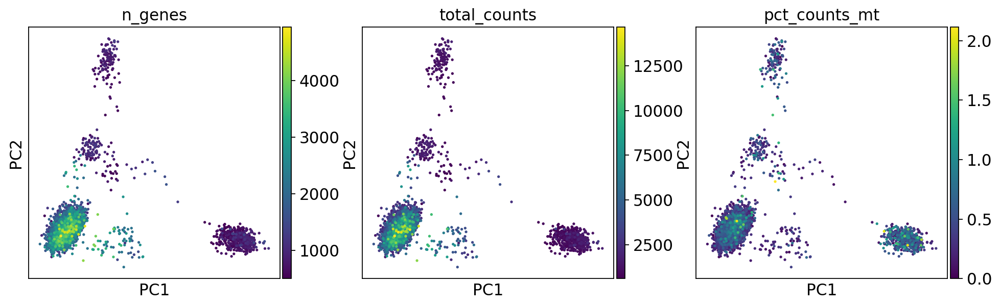

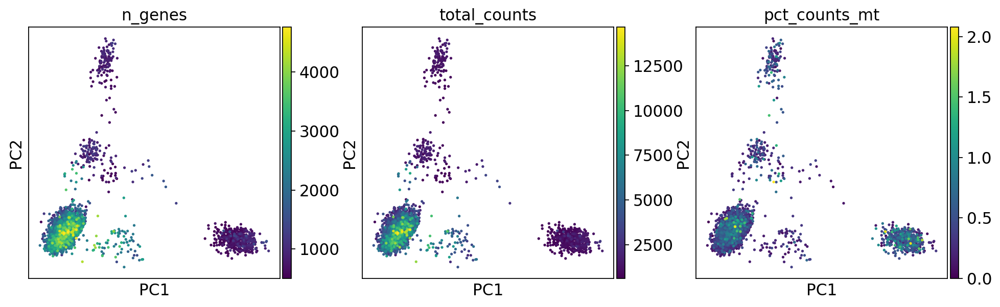

In [121]:
for i in range(numberobj):
    sc.pl.pca(locals()[object_names_filtered[i]], color=['n_genes', 'total_counts', 'pct_counts_mt'], save = "_"+object_names_filtered[i]+"_intron_metrics_1.pdf")
#    sc.pl.pca(locals()[object_names_reg[i]], color=['n_genes', 'total_counts', 'pct_counts_mt'], save = "_"+object_names_reg[i]+"_intron_metrics_1.pdf")


In [122]:
for i in range(numberobj):
    sc.tl.pca(locals()[object_names_reg[i]], svd_solver='arpack')

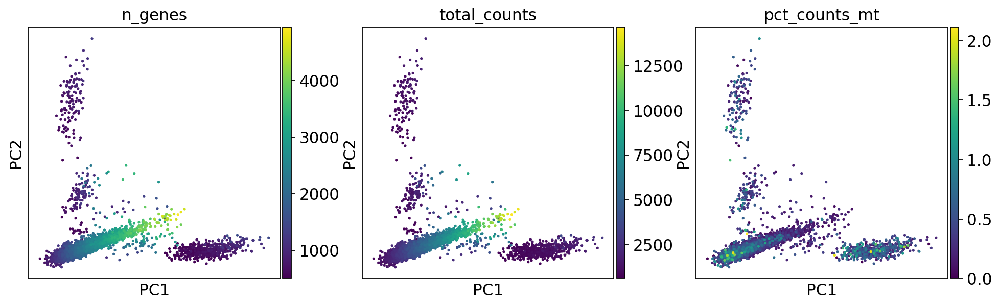

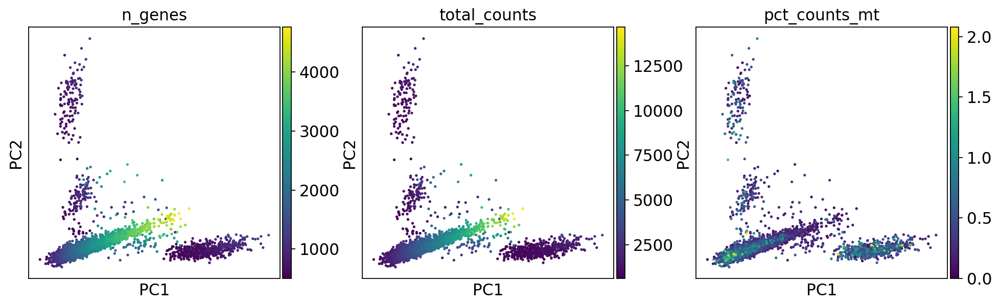

In [123]:
for i in range(numberobj):
    sc.pl.pca(locals()[object_names_reg[i]], color=['n_genes', 'total_counts', 'pct_counts_mt'], save = "_"+object_names_reg[i]+"_intron_metrics_1.pdf")

**Visualizing cells with marker genes:**<br>
Gfap: Astrocytes <br>
Plp1: myelin proteolipid protein, oligodendritic glial sheaths<br>
Rbfox3: post-mitotic neurons<br>
Gad1: GABAergic neuronal marker (extrasynaptic and metabolic purposes)<br>
Gad2: GABAergic neuronal marker (regulate vesicular pool for release)<br>
Slc17a6: glutamatergic neurons (with Th colocalize VTA)<br>
Th: Dopaminergic neurons<br>
Pecam1: Endothelial cells<br>
P2ry12: Microglia<br>

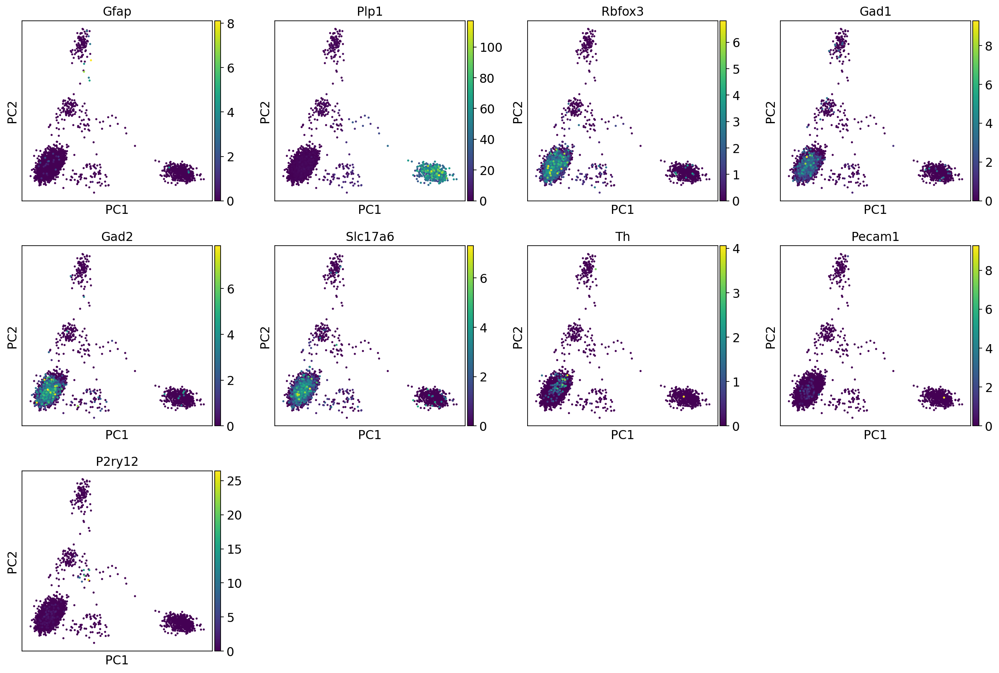

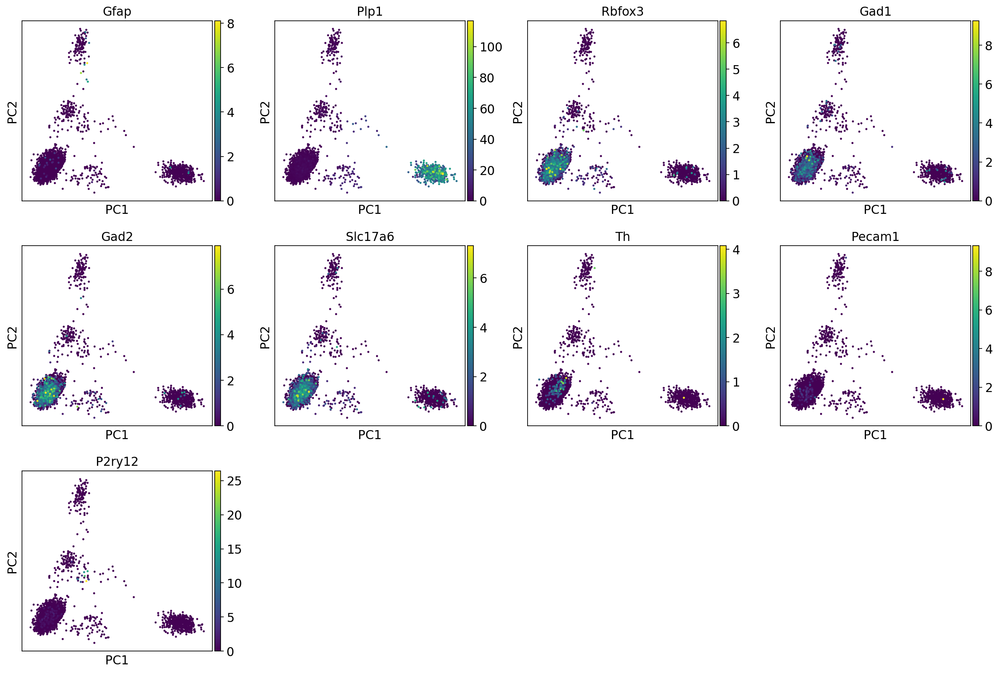

In [124]:
for i in range(numberobj):
    if locals()[object_names_filtered[i]].obs['species'][0] == 'Homo sapien':
        sc.pl.pca(locals()[object_names_filtered[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'SLC17A6','STMN1','TMEM119'], 
                save = "_"+object_names_filtered[i]+"_metrics_2.pdf") # title =object_names[i],
#        sc.pl.pca(locals()[object_names_reg[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'SLC17A6','STMN1'], 
#                save = "_"+object_names_reg[i]+"_metrics_2.pdf") #title =object_names[i],
    elif locals()[object_names_filtered[i]].obs['species'][0] == 'Mus musculus':
        sc.pl.pca(locals()[object_names_filtered[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2','Slc17a6','Th','Pecam1','P2ry12' ], 
                save = "_"+object_names_filtered[i]+"_metrics_2.pdf") #title =object_names_reg[i], 
#        sc.pl.pca(locals()[object_names_reg[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'], 
#                save = "_"+object_names_reg[i]+"_metrics_2.pdf") #title =object_names_reg[i], 


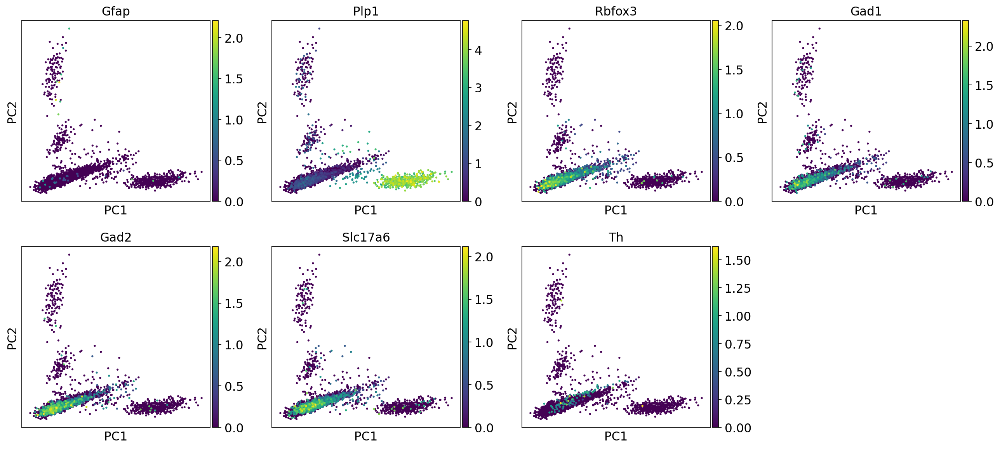

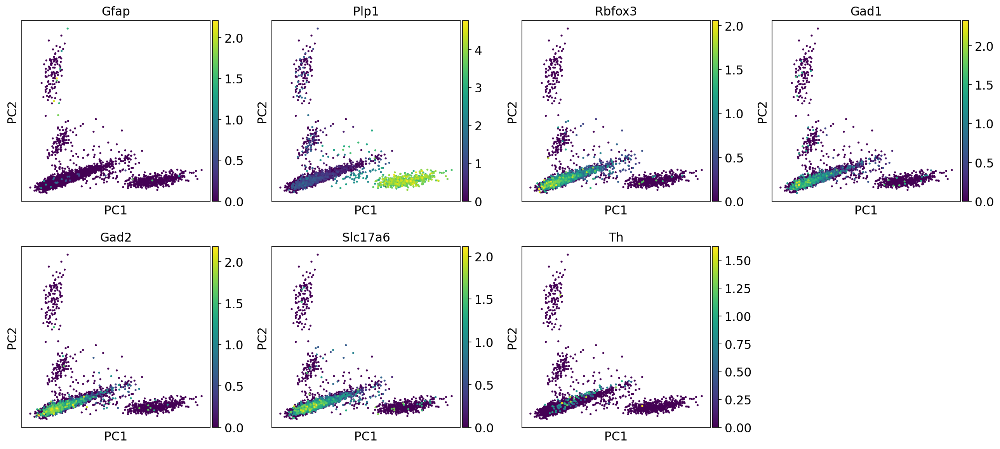

In [125]:
for i in range(numberobj):
    if locals()[object_names_filtered[i]].obs['species'][0] == 'Homo sapien':
        sc.pl.pca(locals()[object_names_filtered[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'SLC17A6','STMN1'], 
                save = "_"+object_names_filtered[i]+"_metrics_2.pdf") # title =object_names[i],
#        sc.pl.pca(locals()[object_names_reg[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'SLC17A6','STMN1'], 
#                save = "_"+object_names_reg[i]+"_metrics_2.pdf") #title =object_names[i],
    elif locals()[object_names_filtered[i]].obs['species'][0] == 'Mus musculus':
#        sc.pl.pca(locals()[object_names_filtered[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2','Slc17a6','Th'], 
#                save = "_"+object_names_filtered[i]+"_metrics_2.pdf") #title =object_names_reg[i], 
        sc.pl.pca(locals()[object_names_reg[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'], 
                save = "_"+object_names_reg[i]+"_metrics_2.pdf") #title =object_names_reg[i], 


In [126]:
for i in range(numberobj):
    print(locals()[object_names_filtered[i]])

AnnData object with n_obs × n_vars = 5300 × 31040
    obs: 'species', 'gender', 'age', 'cngb_sample_id', 'sample_name', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'n_counts_no_mito', 'total_counts_norm'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'scrublet', 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
AnnData object with n_obs × n_vars = 5308 × 32272
    obs: 'species', 'gender', 'age', 'cngb_sample_id', 'sample_name', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_count

### UMAP

Let us compute the neighborhood graph of cells using the PCA representation of the data matrix. You might simply use default values here. \
We will run the following for quick analyses. Later, we will use some metrics to fing out the best dimensionality reduction parameters for UMAP and t-SNE. This is best done on merged datasets

In [43]:
nn = int(np.sqrt(len(locals()[object_names_filtered[i]])/2))
nn

51

In [130]:
nn= 15 #default 15
for i in range(numberobj):
    sc.pp.neighbors(locals()[object_names_filtered[i]], n_neighbors=nn, n_pcs=40)
    sc.pp.neighbors(locals()[object_names_reg[i]], n_neighbors=nn, n_pcs=40)
    sc.tl.umap(locals()[object_names_filtered[i]])
    sc.tl.umap(locals()[object_names_reg[i]])

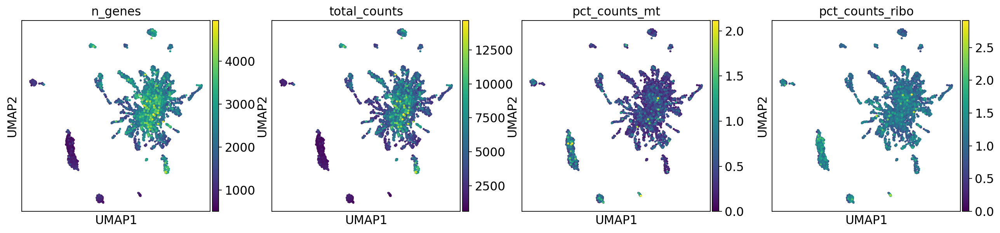

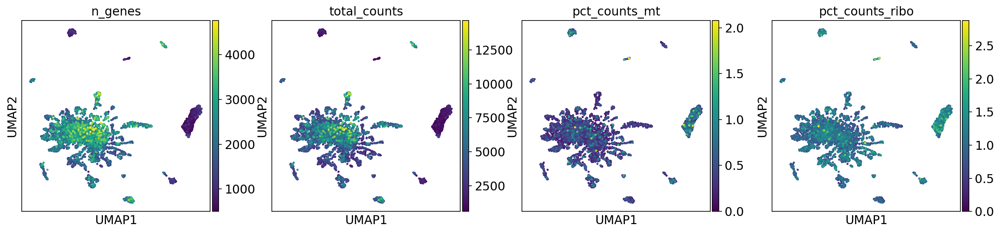

In [128]:
for i in range(numberobj):
    sc.pl.umap(locals()[object_names_filtered[i]], color=['n_genes', 'total_counts', 'pct_counts_mt','pct_counts_ribo'], use_raw=True, s=25,
           save = "_"+object_names_filtered[i]+"_umap_n"+str(nn)+"_1.pdf")

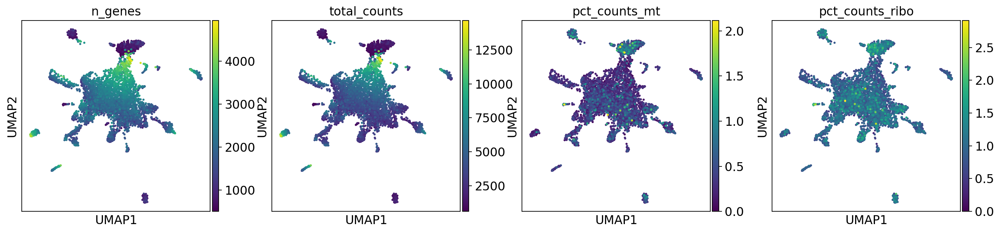

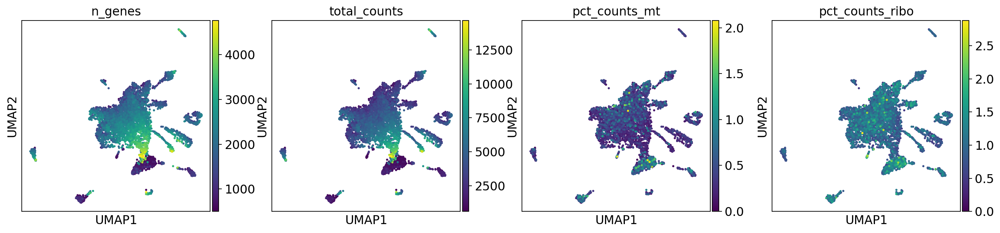

In [131]:
for i in range(numberobj):
    sc.pl.umap(locals()[object_names_reg[i]], color=['n_genes', 'total_counts', 'pct_counts_mt','pct_counts_ribo'], use_raw=True, s=25,
           save = "_"+object_names_reg[i]+"_umap_n"+str(nn)+"_1.pdf")

### Plot with marker genes

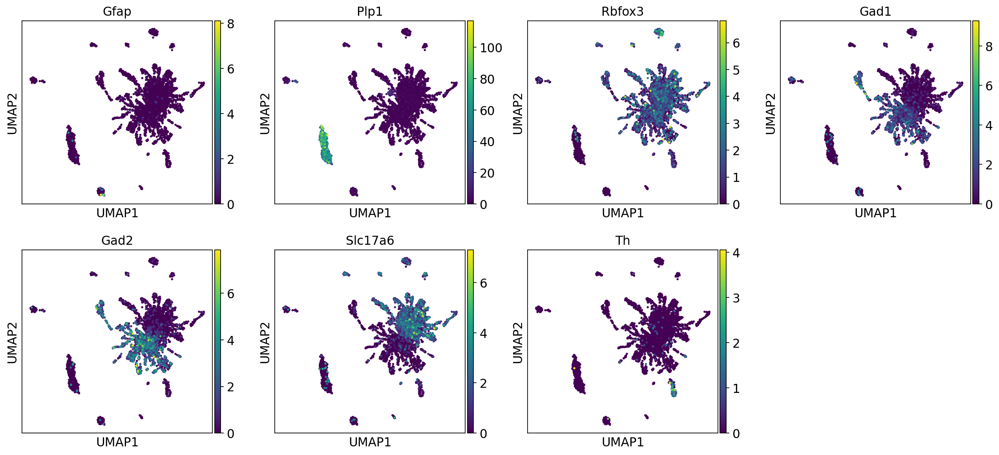

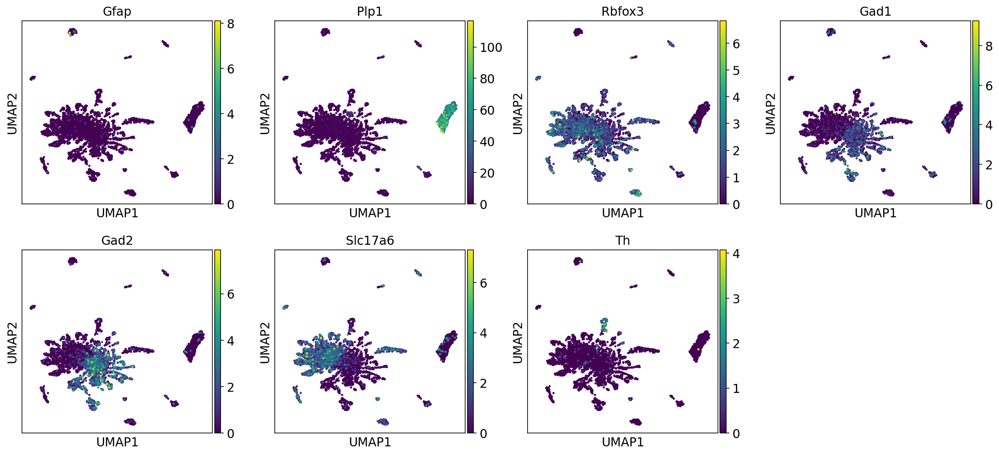

In [132]:
for i in range(numberobj):
    if locals()[object_names_filtered[i]].obs['species'][0] == 'Homo sapien':
        sc.pl.umap(locals()[object_names_filtered[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'TH','SLC17A6'], use_raw=True, s=25,
           save = "_"+object_names_filtered[i]+"_umap_n"+str(nn)+"_2.pdf")
    else:
        sc.pl.umap(locals()[object_names_filtered[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'], use_raw=True, s=25,
           save = "_"+object_names_filtered[i]+"_umap_n"+str(nn)+"_2.pdf")

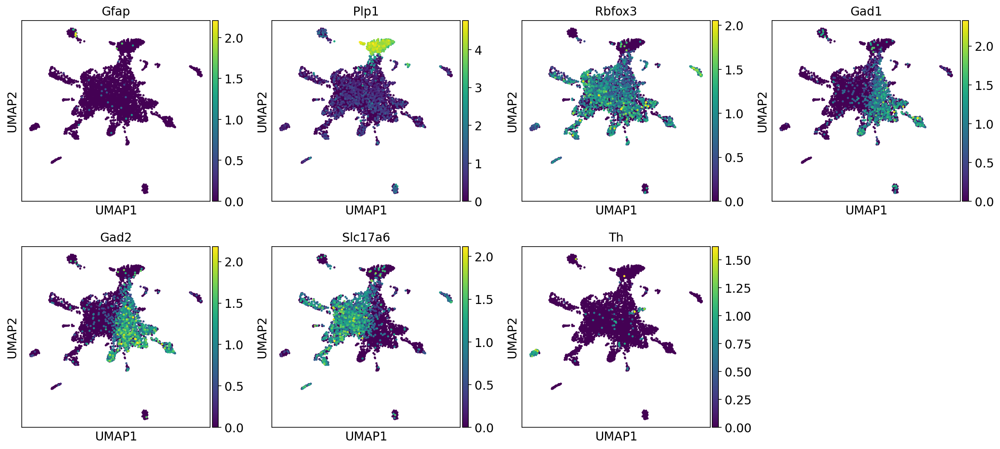

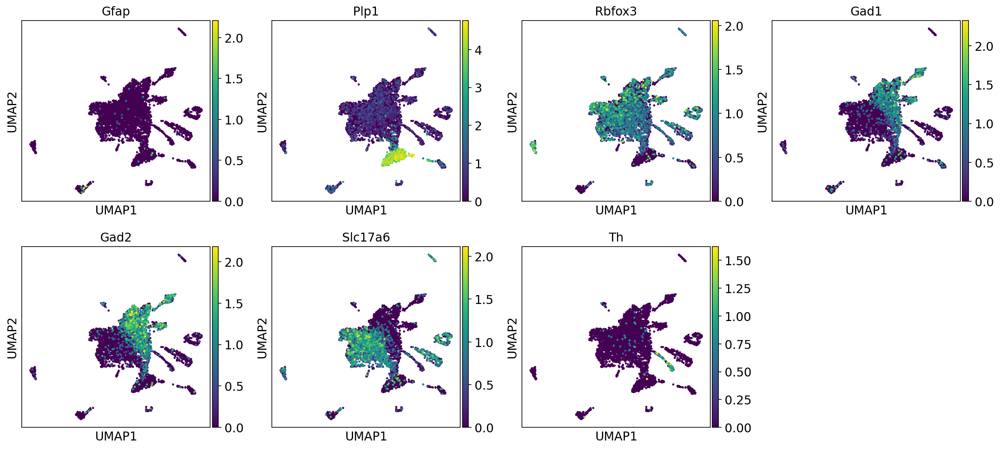

In [133]:
for i in range(numberobj):
    if locals()[object_names_reg[i]].obs['species'][0] == 'Homo sapien':
        sc.pl.umap(locals()[object_names_reg[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'TH','SLC17A6'], use_raw=True, s=25,
           save = "_"+object_names_reg[i]+"_umap_n"+str(nn)+"_2.pdf")
    else:
        sc.pl.umap(locals()[object_names_reg[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'], use_raw=True, s=25,
           save = "_"+object_names_reg[i]+"_umap_n"+str(nn)+"_2.pdf")

In [134]:
!ls figures

pca_adata_CNR0176487_new_filtered_intron_metrics_1.pdf
pca_adata_CNR0176487_new_filtered_metrics_2.pdf
pca_adata_CNR0176487_new_filtered_reg_intron_metrics_1.pdf
pca_adata_CNR0176487_new_filtered_reg_metrics_2.pdf
pca_adata_CNR0176487_old_filtered_intron_metrics_1.pdf
pca_adata_CNR0176487_old_filtered_metrics_2.pdf
pca_adata_CNR0176487_old_filtered_reg_intron_metrics_1.pdf
pca_adata_CNR0176487_old_filtered_reg_metrics_2.pdf
umap_adata_CNR0176487_new_filtered_reg_umap_n10_1.pdf
umap_adata_CNR0176487_new_filtered_reg_umap_n10_2.pdf
umap_adata_CNR0176487_new_filtered_reg_umap_n15_1.pdf
umap_adata_CNR0176487_new_filtered_reg_umap_n15_2.pdf
umap_adata_CNR0176487_new_filtered_reg_umap_n51_1.pdf
umap_adata_CNR0176487_new_filtered_reg_umap_n51_2.pdf
umap_adata_CNR0176487_new_filtered_umap_n10_1.pdf
umap_adata_CNR0176487_new_filtered_umap_n10_2.pdf
umap_adata_CNR0176487_new_filtered_umap_n15_1.pdf
umap_adata_CNR0176487_new_filtered_umap_n15_2.pdf
umap_adata_CNR0176487_new_filtered_umap_n51_1.pd

### Save
nn =15

In [135]:
for i in range(numberobj):
    locals()[object_names_filtered[i]].write(os.path.join('./'+object_names_filtered[i][6:20]+'_processed.h5ad'))
    locals()[object_names_reg[i]].write(os.path.join('./'+object_names_reg[i][6:14]+'_reg_processed.h5ad'))

## Merging

In [1]:
#old (ensemble 93)
old_processed = '/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_reference_testing/data/CNR0176487_old_processed.h5ad' 

#new (ensemble 98)
new_processed = '/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_reference_testing/data/CNR0176487_new_processed.h5ad' 


In [8]:
#set data path
os.chdir('/home/hers_basak/jjiang/jack/outputs/deliverables/0_testing/0_reference_testing/data')

FileNotFoundError: [Errno 2] No such file or directory: '/home/hers_basak/jjiang/jack/outputs/deliverables/0_testing/0_reference_testing/data'

In [7]:
os.getcwd()

'/home/hers_basak/jjiang/notebooks/0_tests/first_test'

In [6]:
!ls

CNR0176487_new_filtered_1.h5ad	  CNR0176487_old_preprocessed.h5ad
CNR0176487_new_preprocessed.h5ad  CNR0176487_old_processed.h5ad
CNR0176487_new_processed.h5ad	  CNR01764_reg_processed.h5ad
CNR0176487_old_filtered_1.h5ad	  figures


In [7]:
files = [old_processed, new_processed]

In [8]:
names = [name.split('_processed')[0].split('/data/')[1] for name in files ]
print(names)

['CNR0176487_old', 'CNR0176487_new']


In [9]:
object_names_processed=list()
numberobj = len(files)

for i in range(numberobj):
    object_names_processed.append("adata"+"_"+names[i]+"_"+"processed")
    locals()[object_names_processed[i]] = sc.read(files[i]) 
    print(object_names_processed[i],' is loaded')

adata_CNR0176487_old_processed  is loaded
adata_CNR0176487_new_processed  is loaded


In [10]:
locals()[object_names_processed[0]]

AnnData object with n_obs × n_vars = 5300 × 31040
    obs: 'species', 'gender', 'age', 'cngb_sample_id', 'sample_name', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'n_counts_no_mito', 'total_counts_norm'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'neighbors', 'pca', 'scrublet', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

Add dataset annotation

In [11]:
refs = ['Ensemble 93', 'Ensemble 98']
for i in range(numberobj):
    locals()[object_names_processed[i]].obs['ref'] = refs[i]
    

In [12]:
adata_merge = ad.concat([adata_CNR0176487_old_processed,adata_CNR0176487_new_processed],  join="outer")
adata_merge.obs_names_make_unique()

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


pca again

In [37]:
sc.tl.pca(adata_merge, svd_solver='arpack')
#    sc.tl.pca(locals()[object_names_reg[i]], svd_solver='arpack')

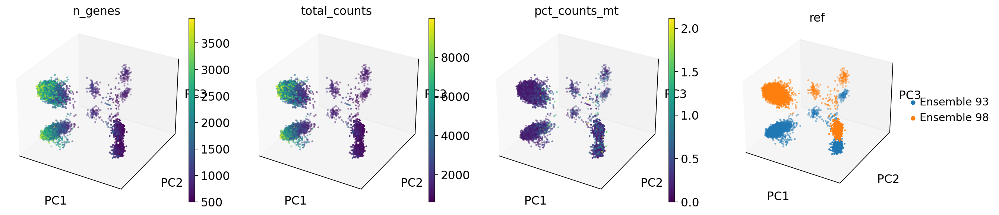

In [198]:
sc.pl.pca(adata_merge, color=['n_genes', 'total_counts', 'pct_counts_mt', 'ref'], projection ='3d') #save = "_merge_pca_1.pdf")
#    sc.pl.pca(locals()[object_names_reg[i]], color=['n_genes', 'total_counts', 'pct_counts_mt'], save = "_"+object_names_reg[i]+"_intron_metrics_1.pdf")


In [38]:
nn= 15 #default 15
sc.pp.neighbors(adata_merge, n_neighbors=nn, n_pcs=40)
sc.tl.umap(adata_merge)

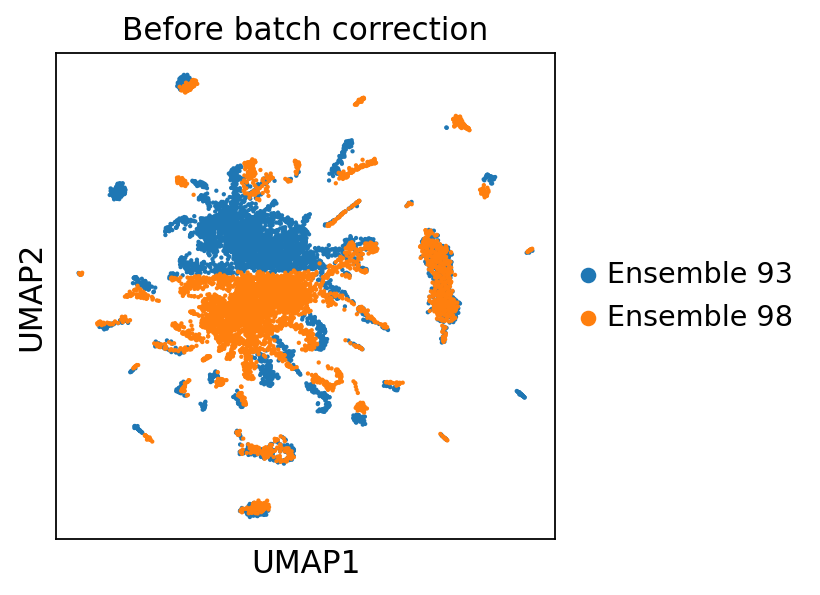

In [39]:
sc.pl.umap(adata_merge,color=['ref'], wspace=0.4,s=15, title='Before batch correction')

In [276]:
adata_merge

AnnData object with n_obs × n_vars = 10608 × 33489
    obs: 'species', 'gender', 'age', 'cngb_sample_id', 'sample_name', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'n_counts_no_mito', 'total_counts_norm', 'ref'
    uns: 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

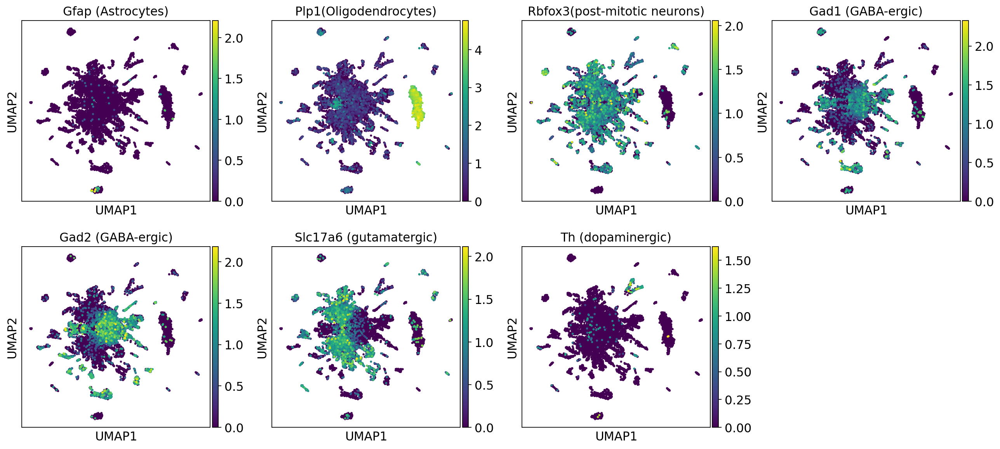

In [40]:

    if adata_merge.obs['species'][0] == 'Homo sapien':
        sc.pl.umap(adata_merge, color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'TH','SLC17A6'], use_raw=True, s=25,
           save = "merge_umap_n"+str(nn)+"_2.pdf")
    else:
        sc.pl.umap(adata_merge, color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (gutamatergic)', 'Th (dopaminergic)'], use_raw=False, s=25,save = "_merge_umap_n"+str(nn)+"_2.pdf")

rescaling

In [54]:
adata_merge_rb = adata_merge.copy()

In [50]:
sc.tl.pca(adata_merge_rb, svd_solver='arpack')

In [51]:
sc.external.pp.harmony_integrate(adata_merge_rb, key =['ref'])

2023-03-23 00:51:02,566 - harmonypy - INFO - Iteration 1 of 10
2023-03-23 00:51:06,050 - harmonypy - INFO - Iteration 2 of 10
2023-03-23 00:51:09,423 - harmonypy - INFO - Iteration 3 of 10
2023-03-23 00:51:12,783 - harmonypy - INFO - Iteration 4 of 10
2023-03-23 00:51:16,020 - harmonypy - INFO - Iteration 5 of 10
2023-03-23 00:51:19,223 - harmonypy - INFO - Iteration 6 of 10
2023-03-23 00:51:20,431 - harmonypy - INFO - Converged after 6 iterations


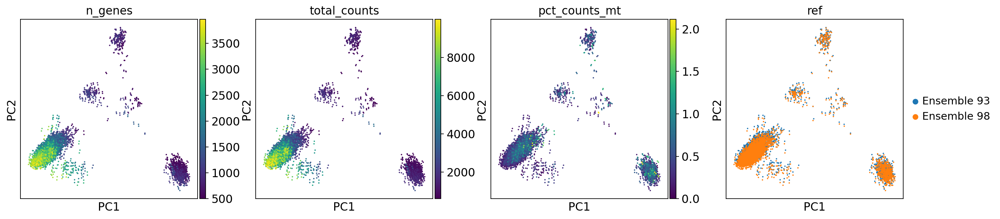

In [201]:
sc.pl.pca(adata_merge, color=['n_genes', 'total_counts', 'pct_counts_mt', 'ref'], save = "_merge_pca_1.pdf")
#    sc.pl.pca(locals()[object_names_reg[i]], color=['n_genes', 'total_counts', 'pct_counts_mt'], save = "_"+object_names_reg[i]+"_intron_metrics_1.pdf")


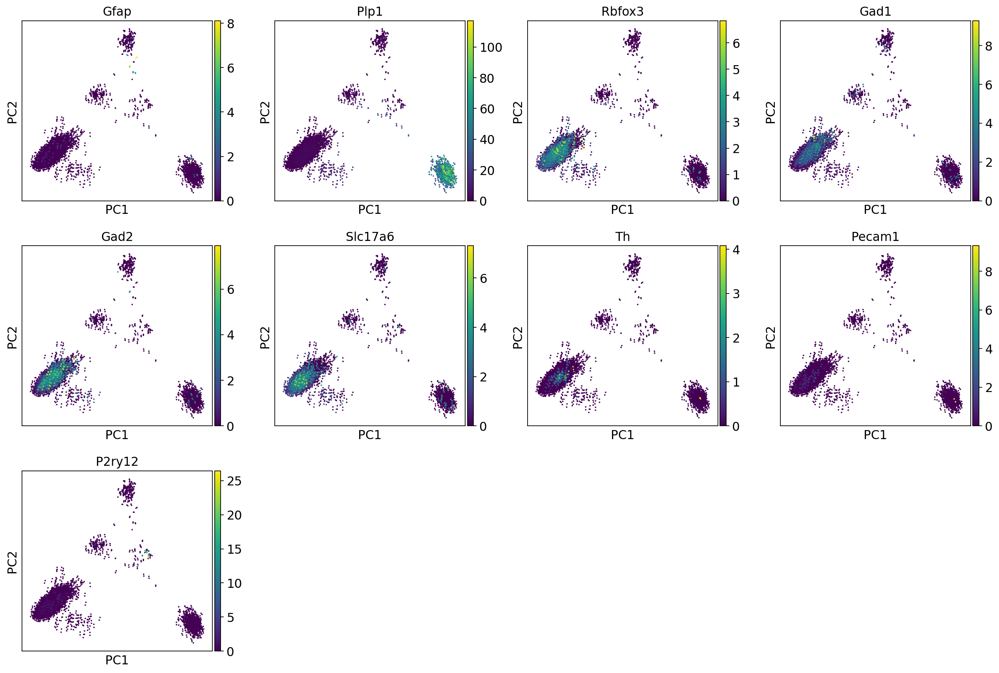

In [231]:
sc.pl.pca(adata_merge_rb, color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2','Slc17a6','Th','Pecam1','P2ry12' ])

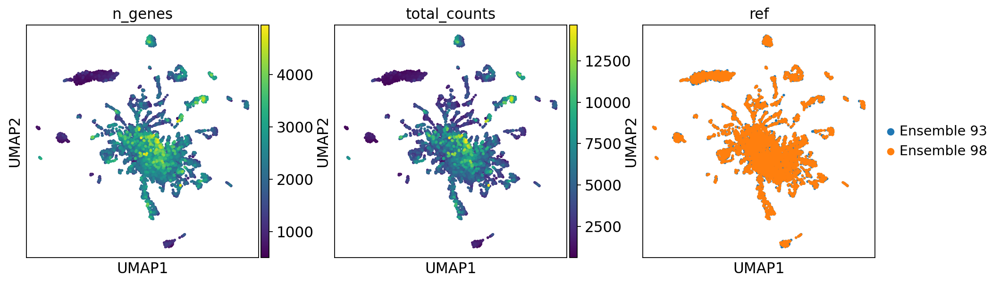

In [52]:
sc.pp.neighbors(adata_merge_rb, n_neighbors=nn, n_pcs=40,use_rep='X_pca_harmony')
sc.tl.umap(adata_merge_rb)
sc.pl.umap(adata_merge_rb, color=['n_genes', 'total_counts','ref'], 
           use_raw=False, s=25,save = '_merge_batch_rb_1.pdf')

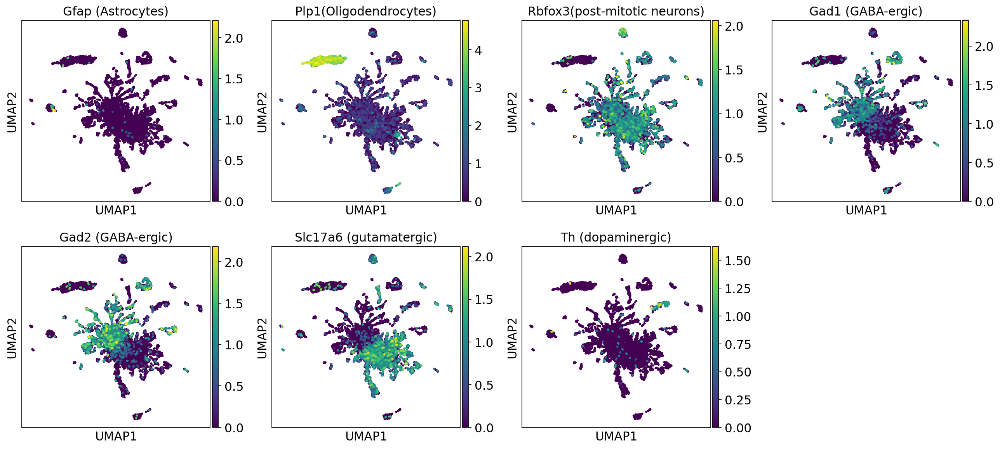

In [53]:

sc.pl.umap(adata_merge_rb, color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (gutamatergic)', 'Th (dopaminergic)'], use_raw=False, s=25)
   #save = "_merge_umap_n"+str(nn)+"_2.pdf")

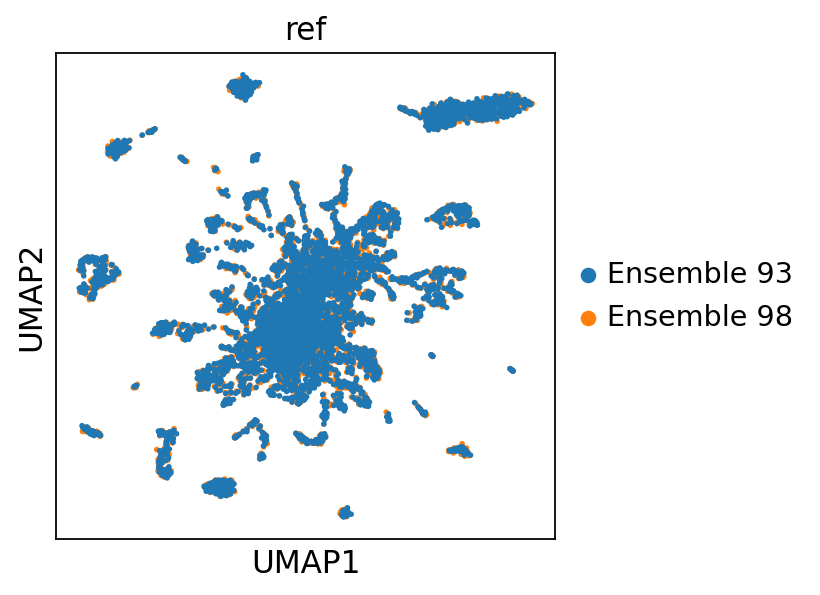

In [234]:
sorted_adata_merge_rb = adata_merge_rb[adata_merge_rb.obs.sort_values('ref', ascending = False).index]
sc.pl.umap(sorted_adata_merge_rb, color=['ref'], use_raw=False, s=25)

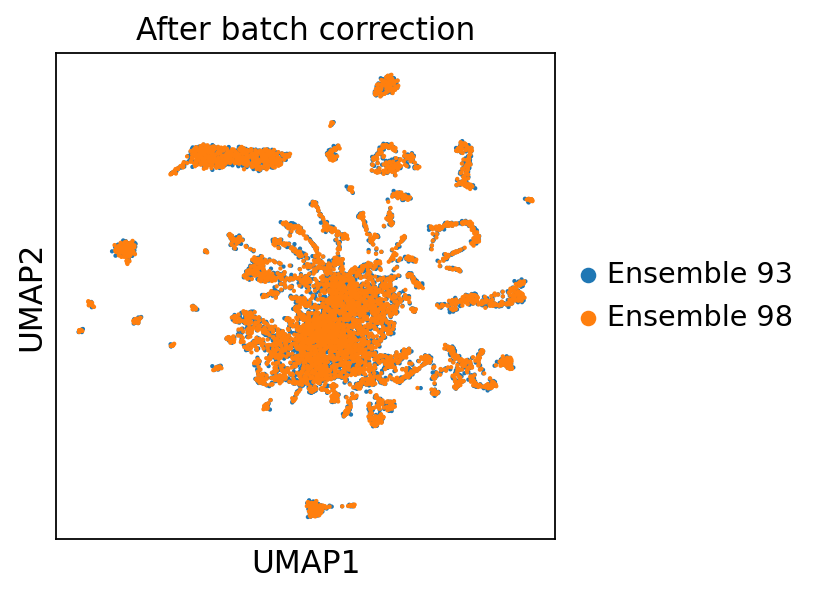

In [44]:
sc.pl.umap(adata_merge_rb, color=['ref'], use_raw=False, s=15,title='After batch correction')

In [170]:
!ls

CNR0176487_new_filtered_1.h5ad	  CNR0176487_old_preprocessed.h5ad
CNR0176487_new_preprocessed.h5ad  CNR0176487_old_processed.h5ad
CNR0176487_new_processed.h5ad	  CNR01764_reg_processed.h5ad
CNR0176487_old_filtered_1.h5ad	  figures


In [171]:
min_counts = 500 #default
max_counts = 10000 #filters out none, maybe 15k later
min_genes = 500
max_genes = 4000
min_cells = 3



for i in range(numberobj):
    adata_merge = adata_merge[adata_merge.obs['total_counts']>=min_counts]
    adata_merge = adata_merge[adata_merge.obs['total_counts'] < max_counts ]
    adata_merge = adata_merge[adata_merge.obs['n_genes'] >= min_genes]
    adata_merge = adata_merge[adata_merge.obs['n_genes'] < max_genes]
    
    sc.pp.filter_genes(adata_merge, min_cells=min_cells)

Trying to set attribute `.var` of view, copying.
Trying to set attribute `.var` of view, copying.


In [172]:
adata_merge_test = adata_merge.copy()

In [173]:
sc.external.pp.harmony_integrate(adata_merge_test, key =['ref'])

2023-03-22 16:59:31,132 - harmonypy - INFO - Iteration 1 of 10
2023-03-22 16:59:35,653 - harmonypy - INFO - Iteration 2 of 10
2023-03-22 16:59:40,179 - harmonypy - INFO - Converged after 2 iterations


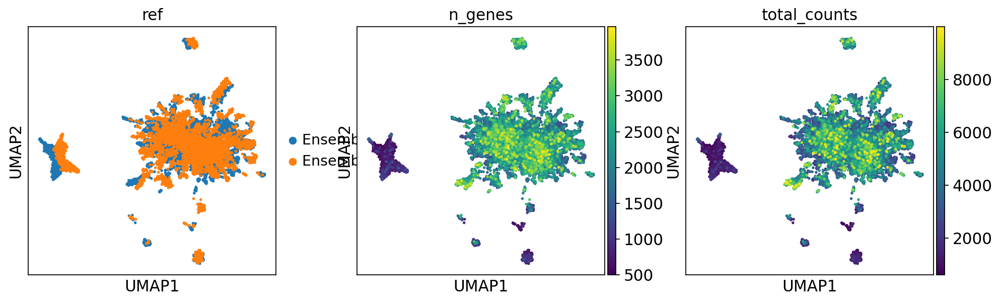

In [175]:
sc.pp.neighbors(adata_merge_test, n_neighbors=15, n_pcs=40,use_rep='X_pca_harmony')
sc.tl.umap(adata_merge_test)
sc.pl.umap(adata_merge_test, color=['ref','n_genes', 'total_counts'], 
           use_raw=False, s=25,save = '_merge_batch_test_1.pdf')